<a href="https://colab.research.google.com/github/Guillaume-mcgill/school/blob/main/ECSE415_assignment1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ECSE 415: ASSIGNMENT 1**

NAME: GUILLAUME RODIER

ID: 260975661

***IMPORTED LIBRARIES:***

In [ ]:
# google drive
from google.colab import drive

# Open CV
import cv2

# numpy
import numpy as np

# matplotlib (for graphs)
# this was not explicitely said to be an acceptable import in the assignment,
# but I assumed it was okay to use it since you need it to output the images
import matplotlib.pyplot as plt

# Scikit-Image
import skimage.metrics
%matplotlib inline

# **1. DENOISING**

# ***1.1 GAUSSIAN NOISE***

In [ ]:
drive.mount('/content/drive')

# make a path variable pointing to the working google drive folder
path = '/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment1/images/'

img = cv2.imread(path + 'messi.png')
img2 = cv2.imread(path + 'messi-gaussian.png')

# reading image size
height, width, depth = img.shape
print("image format: ", height,width,depth)

# cv2 reads images in BGR format, convert it to RGB
# the idea to use cv2.COLOR_BGR2RGB was taken from the tutorial 2
image = img.copy()
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image2 = img2.copy()
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# converting the images to grayscale
# the idea to use cv2.COLOR_RGB2GRAY was taken from the tutorial 2
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

# output the images
plt.figure(figsize=(20,32))
plt.subplot(121), plt.imshow(gray, cmap='gray'), plt.title("Normal Messi Image")
plt.subplot(122), plt.imshow(gray2, cmap='gray'), plt.title("Messi Image with Gaussian noise")

Mounted at /content/drive
image format:  500 750 3


# ***1.1.1 Filter the noisy image with 3x3 gaussian filter***

(<matplotlib.axes._subplots.AxesSubplot at 0x7f9e34444250>,
 Text(0.5, 1.0, '3x3 Gaussian filtering'))

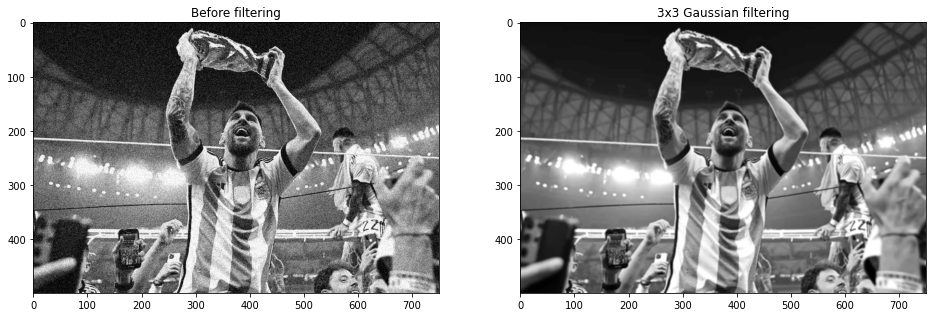

In [ ]:
# variance = 3
# the numbers in the kernel are calculated with the formula for the gaussian
# distribution in the lecture notes

def gaussian_kernel(size, variance):
  assert size%2!=0, "the size of the kernel should be odd"
  middle = size//2
  factor = 1/(2*3.141592*variance)
  kernel = np.zeros((size,size))
  for i in range(size):
    for j in range(size):
      x = i-middle
      y = j-middle
      kernel[i][j] = factor*2.718**(-(x**2+y**2)/(2*variance))
  return kernel

kernel_gauss = gaussian_kernel(size=3, variance=3)

# Filter the image using cv2; inputs: (grayscale image, bit-depth, kernel)
# the idea to use cv2.filter2D was taken from tutorial 2
gaussian_filtered = cv2.filter2D(gray, cv2.CV_16S, kernel_gauss)

# plot everything
plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(gray2, cmap='gray'), plt.title("Before filtering")
plt.subplot(122), plt.imshow(gaussian_filtered, cmap='gray'), plt.title("3x3 Gaussian filtering")

# ***1.1.2 Filter the noisy image with 3x3 box filter***

(<matplotlib.axes._subplots.AxesSubplot at 0x7f9e34452b50>,
 Text(0.5, 1.0, '3x3 box filtering'))

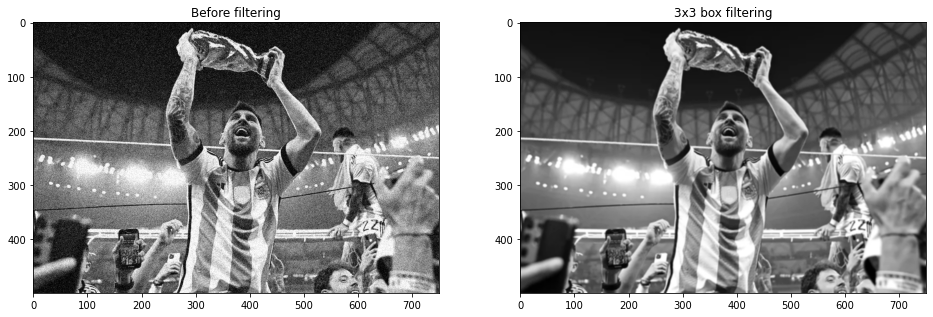

In [ ]:
# computes the box kernel of the appropriate size
def box_kernel(size):
  factor = size**2
  kernel = np.ones((size,size))/factor
  return kernel

kernel_box = box_kernel(size=3)

# Filter the image using cv2; inputs: (grayscale image, bit-depth, kernel)
box_filtered = cv2.filter2D(gray, cv2.CV_16S, kernel_box)

plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(gray2, cmap='gray'), plt.title("Before filtering")
plt.subplot(122), plt.imshow(box_filtered, cmap='gray'), plt.title("3x3 box filtering")

***ANALYSIS:***

Here, the box filtering seems to have removed the Gaussian noise, but it is difficult to compare visually which technique between gaussian filtering and box filtering performed the best. For this reason, we will use the peak-signal-to-noise-ratio (PSNR) metric to get a sense of which technique renders the image of better quality. The PSNR compares the maximum signal value in the image and the power of the noise. The higher this metric, the better the quality of the resulting image. The formula is the following:

PSNR = (10)\*log(MaxI^2/MSE)

where MaxI is the maximum pixel value in the image and MSE is the mean squared error (noise).

additional source: https://www.ni.com/en-ca/innovations/white-papers/11/peak-signal-to-noise-ratio-as-an-image-quality-metric.html#:~:text=The%20term%20peak%20signal%2Dto,the%20quality%20of%20its%20representation.

# ***1.1.3 Compare the Box and Gaussian filters using the peak signal to noise ratio***

In [ ]:
# information on the PSNR was found on the scikit-learn website
# at this link: https://scikit-image.org/docs/stable/api/skimage.metrics.html#skimage.metrics.peak_signal_noise_ratio

pksnr1 = skimage.metrics.peak_signal_noise_ratio(gray, gaussian_filtered)
pksnr2 = skimage.metrics.peak_signal_noise_ratio(gray, box_filtered)

# The box filter gives a superior result, its PSNR is higher (28 instead of 10)
print("PSNR for gaussian filter: ",pksnr1)
print("PSNR for box filter: ",pksnr2)

PSNR for gaussian filter:  10.217112476775245
PSNR for box filter:  28.065864562054067


<ipython-input-5-af6d2947e236>:4: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  pksnr1 = skimage.metrics.peak_signal_noise_ratio(gray, gaussian_filtered)
<ipython-input-5-af6d2947e236>:5: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  pksnr2 = skimage.metrics.peak_signal_noise_ratio(gray, box_filtered)


***ANALYSIS***

By using a Gaussian filter of size 3x3 and variance of 3 to filter the image of Messi with Gaussian noise, we get a peak-signal-to-noise-ratio of 10.22 whereas if we use a box filter of the same size, we get a corresponding peak-signal-to-noise-ratio of 28.065, signifying that we get more signal with the box filter of this specific size than with the gaussian filter. This implies that in the specific case of filtering this image, the box filter of size 3x3 gives superior results than a gaussian filter of the same size (with variance equal to 3).

# **1.2 SALT AND PEPPER NOISE**

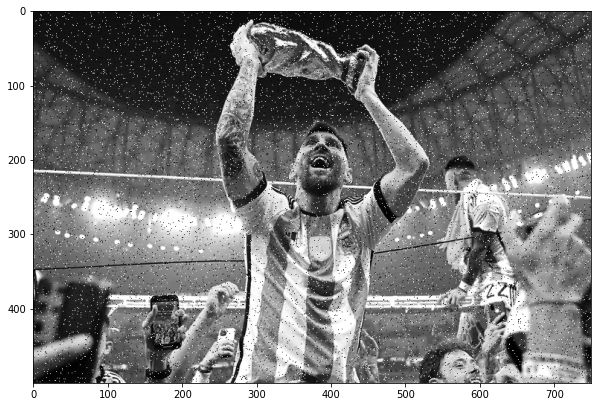

In [ ]:
# read the salt and pepper messi image
img3 = cv2.imread(path + 'salt-and-pepper-messi2.png')
image3 = img3.copy()

# convert from BGR to RGB
image3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)

# converting the image to grayscale
gray3 = cv2.cvtColor(image3, cv2.COLOR_RGB2GRAY)

# display the image
plt.figure(figsize=(10,16))
plt.imshow(gray3, cmap='gray')

# **1.2.1 Filtering with a gaussian filter**

(<matplotlib.axes._subplots.AxesSubplot at 0x7f9e35519af0>,
 Text(0.5, 1.0, '3x3 Gaussian filtering'))

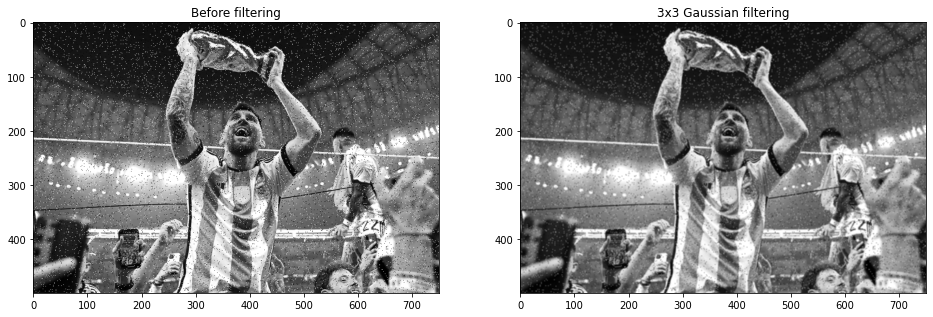

In [ ]:
# Filter the image using cv2; inputs: (grayscale image, bit-depth, kernel)
gaussian_filtered2 = cv2.filter2D(gray3, cv2.CV_16S, kernel_gauss)

# display the initial image and the result of the filtering
plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(gray3, cmap='gray'), plt.title("Before filtering")
plt.subplot(122), plt.imshow(gaussian_filtered2, cmap='gray'), plt.title("3x3 Gaussian filtering")

***ANALYSIS:***

Here we can see that the 3x3 Gaussian filter removes some of the salt and pepper noise, but there is still a lot of noise and the image is more blurry than originally.

# **1.2.2. Implementing a median filter**

***HELPER FUNCTIONS FOR THE MEDIAN FILTER AND PADDING REMOVAL***

In [ ]:
# here, some concepts of the median_filter function were taken from tutorial 2
# in particular, the idea to use np.pad was taken from there

def median_filter(image, filter_size):
  padding_dim = filter_size//2
  # 0 padd the input image
  padded_image = np.pad(image, pad_width=int(padding_dim), mode='constant', constant_values=0)
  output_image = padded_image.copy()

  for i in range(0,padded_image.shape[0]-2*padding_dim):
    for j in range(0,padded_image.shape[1]-2*padding_dim):
      # apply the filter on the image considering the padding
      output_image[i,j] = np.median(padded_image[i:i+filter_size,j:j+filter_size])
  return output_image


# must be applied to the image after median filtering
def remove_padding(image, filter_size):
  padding_dim = filter_size//2
  height = image.shape[0]-2*padding_dim
  width = image.shape[1]-2*padding_dim
  new_image = np.zeros((height,width))
  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      if ((i>=padding_dim and j>=padding_dim) and (i<image.shape[0]-padding_dim and j<image.shape[1]-padding_dim)):
        new_image[i-padding_dim][j-padding_dim]=image[i][j]
  return new_image

***APPLYING THE MEDIAN FILTER ON THE IMAGE***

(<matplotlib.axes._subplots.AxesSubplot at 0x7f9e343aaac0>,
 Text(0.5, 1.0, 'median filtered'))

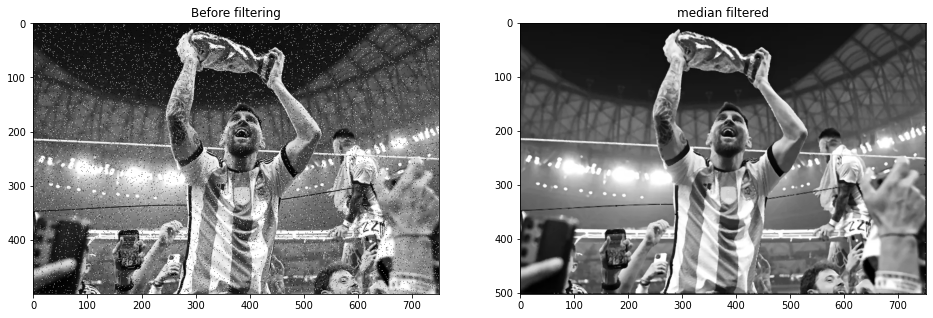

In [ ]:
# apply the median filter
median_filtered = median_filter(gray3,3)
plt.figure(figsize=(16,10))
plt.subplot(121), plt.imshow(gray3, cmap='gray'), plt.title("Before filtering")
plt.subplot(122), plt.imshow(median_filtered, cmap='gray'), plt.title("median filtered")

# **1.2.3. Comparing the peak signal to noise ratio of the gaussian filtered vs median filtered image**

In [ ]:
# remove padding left because of the median filtering
median_filtered_wtpadding = remove_padding(median_filtered,3)
print("image format 1", gray.shape)
print("image format 2", median_filtered_wtpadding.shape)

# calculate the PSNR
pksnr3 = skimage.metrics.peak_signal_noise_ratio(gray, gaussian_filtered2)
pksnr4 = skimage.metrics.peak_signal_noise_ratio(gray, median_filtered_wtpadding)
print("PSNR for gaussian filter: ",pksnr3)
print("PSNR for median filter: ",pksnr4)

image format 1 (500, 750)
image format 2 (500, 750)
PSNR for gaussian filter:  10.166491279058548
PSNR for median filter:  21.570387569620138


<ipython-input-10-8dcdc26c317d>:7: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  pksnr3 = skimage.metrics.peak_signal_noise_ratio(gray, gaussian_filtered2)
<ipython-input-10-8dcdc26c317d>:8: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  pksnr4 = skimage.metrics.peak_signal_noise_ratio(gray, median_filtered_wtpadding)


***ANALYSIS***

As can be seen with the last output, the median filter gives an image that has significantly less noise (if not without any noise) and just visually, it can be observed that the image is of higher quality than when filtered with a gaussian filter. This is confirmed with the PSNR metric: With the median filter, the PSNR is higher than with gaussian filtering, with a value of 21.57 instead of 10.16.

# **1.2.4. Describe the discrepancies between the two reference corrupted images**
**How are Gaussian noise and salt and pepper noise different? What is the best denoising method for these two types of noisy images? (You can use your findings and materials discussed in the classroom)**

Salt and pepper noise is the random occurence of black and white pixels (for grayscal image) and of RGB pixels (for color images). This type of noise is multiplicative and must be dealt with with non-linear filtering methods such as a median filter. On the other hand, gaussian noise is an example of additive noise and can be filtered with linear filtering methods such as a Gaussian filter or a box filter.

Source: course notes

#**2. Canny Edge detection**

# **2.1 Briefly describe the 4 main steps of Canny edge detection:**

The 4 steps for the Canny Edge Detection are the following:

1. Filter the image with the x and the y derivatives of Gaussian. This gaussian smoothing is done to remove noise from the image.
2. Find the orientations and the magnitudes of the gradients. This is done by finding the x and y derivatives of the image with sobel operators. The magnitudes of the gradients are found with the square root of the squarred sum of the x and y gradients and the gradients orientations are computed as the arctan of the y gradient over the x gradient.
3. Perform non-maximum suppression. This thins multi-pixel wide ridges to a single pixel by only conserving local maximums of gradients amplitudes in the orientations of the local gradients.
4. Threshold with a high and a low threshold (hysterisis):
 use the high threshold to start the edge curves and the low threshold to continue them. The gradient values below the lower threshold are discarded and those in between the two thresholds are kept only if they prolongate strong edges (gradients that are over the higher threshold).

# **2.2 Effects of the K, L and H parameters in Canny edge detection**

(<matplotlib.image.AxesImage at 0x7f9e353266d0>,
 Text(0.5, 1.0, 'Initial CN tower grayscale image'))

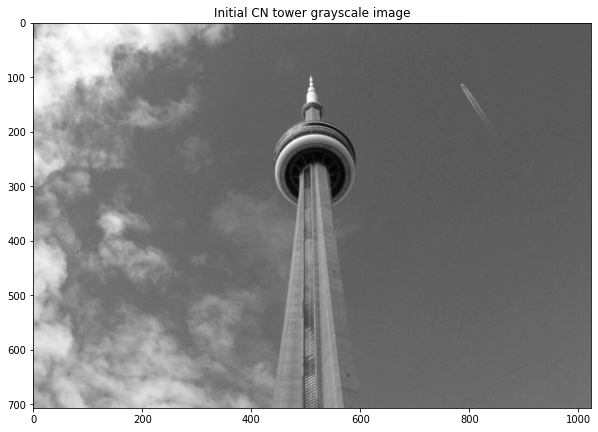

In [ ]:
# LOAD THE IMAGE
canny_img = cv2.imread(path + 'cntower.jpg')

# cv2 reads images in BGR format, convert it to RGB
tower_image = canny_img.copy()
tower_image = cv2.cvtColor(tower_image, cv2.COLOR_BGR2RGB)

# convert to grayscale
tower_image = cv2.cvtColor(tower_image, cv2.COLOR_RGB2GRAY)

# output the image
plt.figure(figsize=(10,16))
plt.imshow(tower_image, cmap='gray'),  plt.title("Initial CN tower grayscale image")

***K = 3 , L = 10 , H = 80***

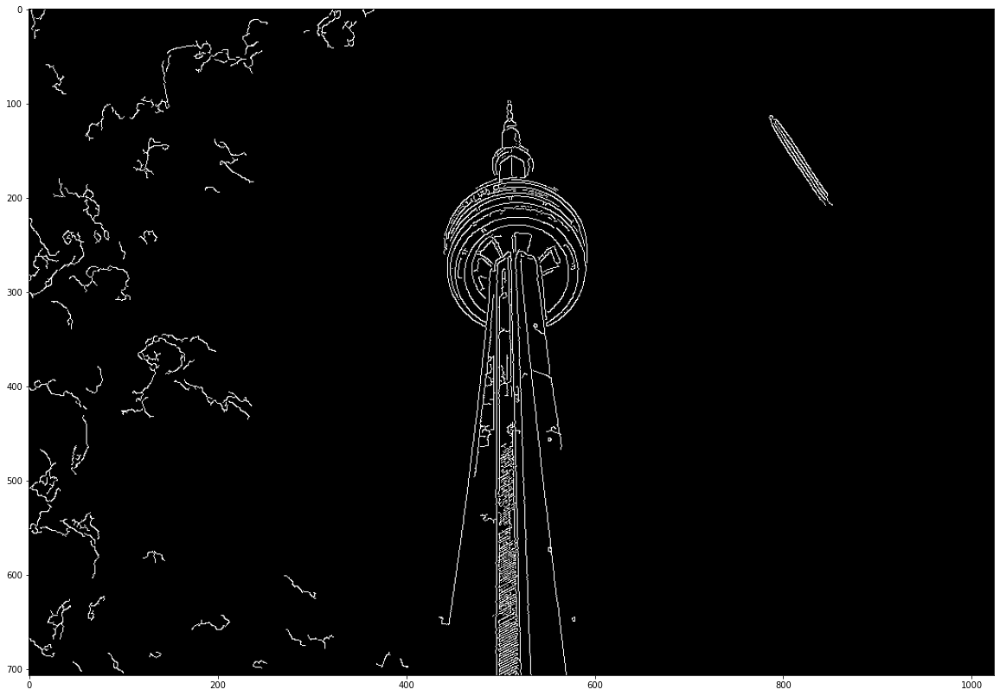

In [ ]:
# canny edge detection (assume sigma is 1)
# the cv2.GaussianBlur and cv2.Canny methods were taken from the assignment description
# more information about those methods was found on the openCV website:
# gaussian blurring : https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html
# canny edge detection : https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html

gaussian_smoothed1 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge1 = cv2.Canny(gaussian_smoothed1, 10, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge1, cmap="gray")

***K = 3 , L = 10 , H = 100***

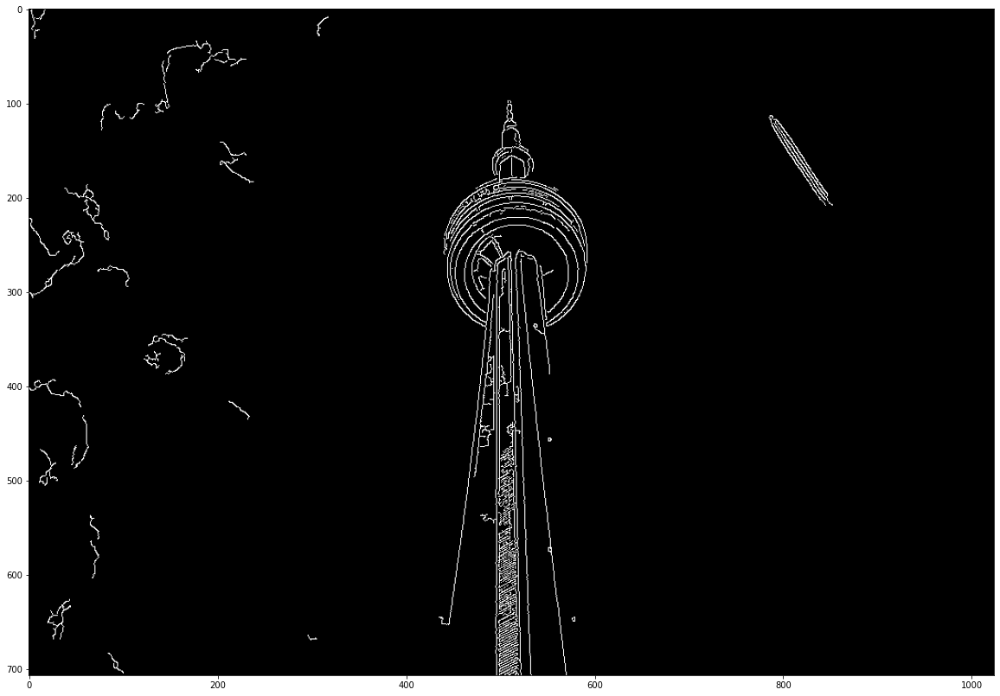

In [ ]:
gaussian_smoothed2 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge2 = cv2.Canny(gaussian_smoothed2, 10, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge2, cmap="gray")

***K = 3 , L = 10 , H = 150***

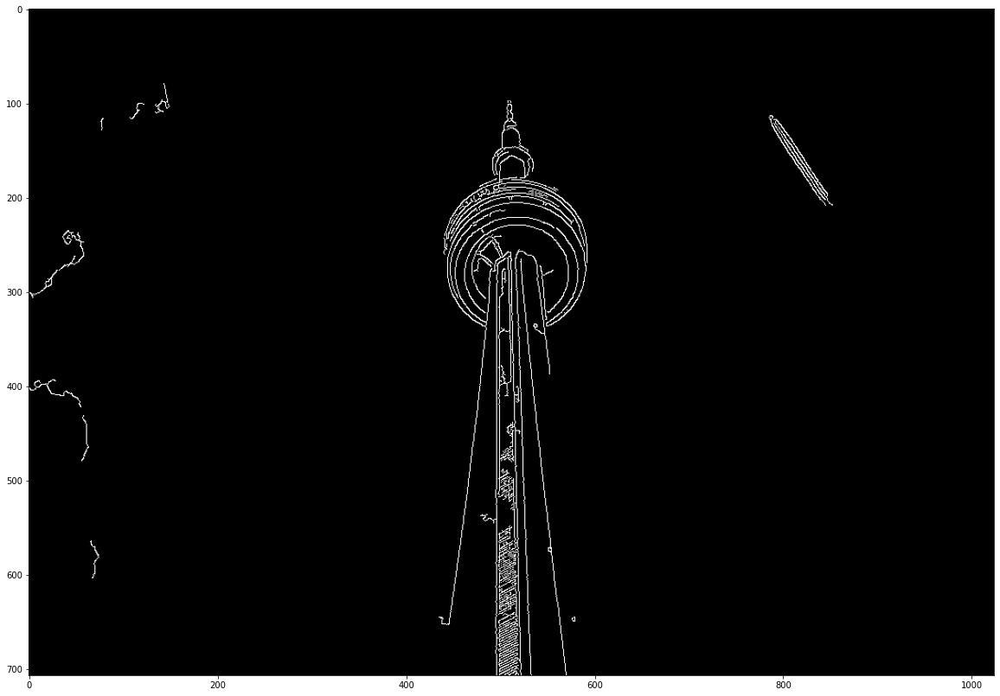

In [ ]:
gaussian_smoothed3 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge3 = cv2.Canny(gaussian_smoothed3, 10, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge3, cmap="gray")

***K = 3 , L = 30 , H = 80***

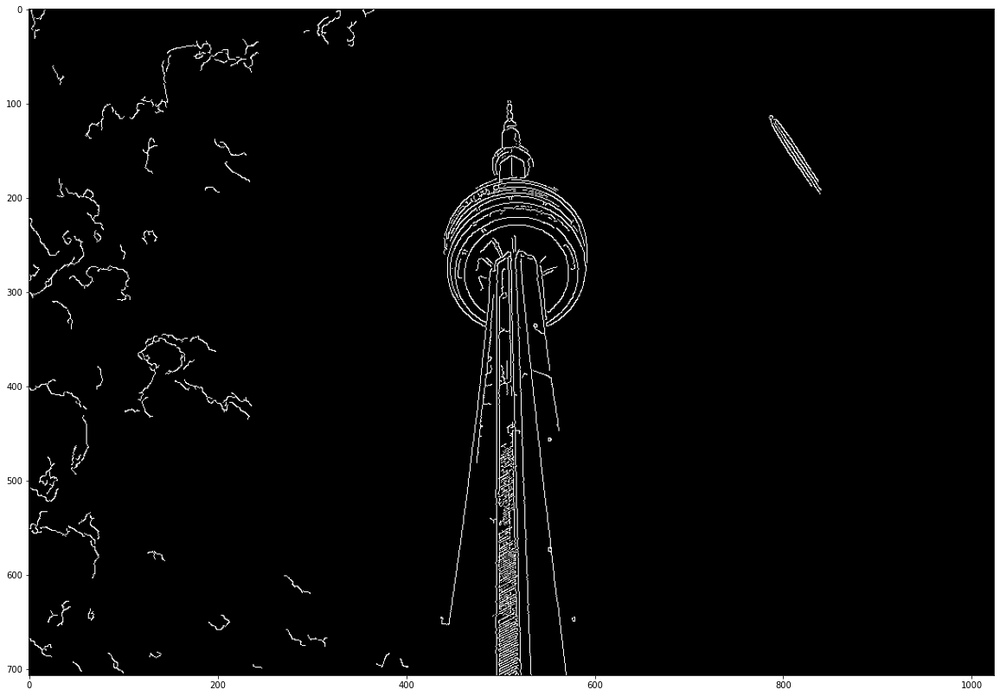

In [ ]:
gaussian_smoothed4 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge4 = cv2.Canny(gaussian_smoothed4, 30, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge4, cmap="gray")

***K = 3 , L = 30 , H = 100***

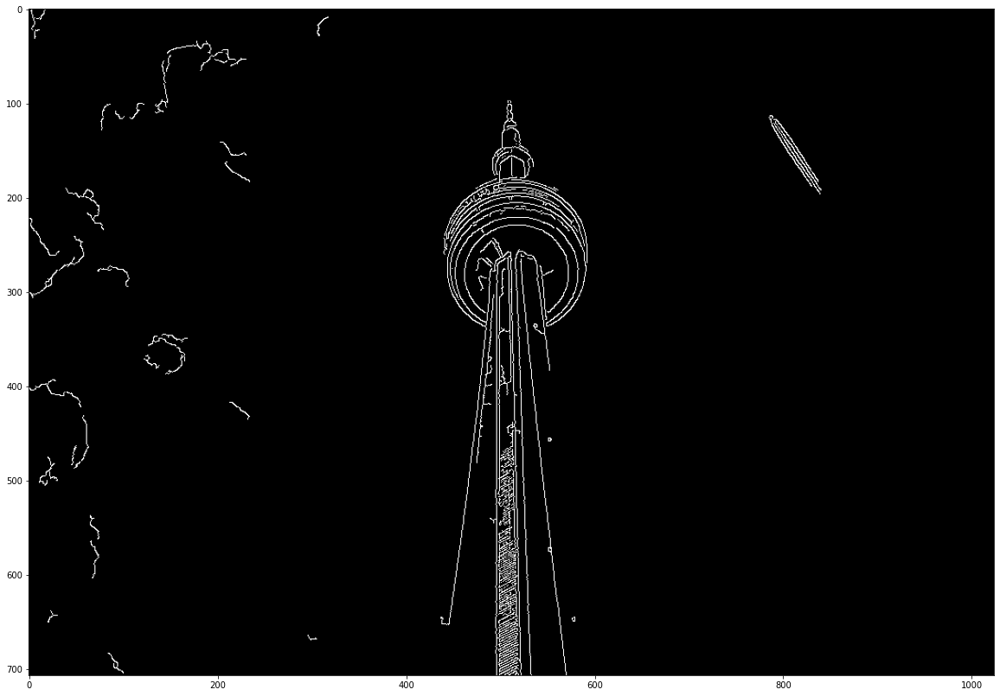

In [ ]:
gaussian_smoothed5 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge5 = cv2.Canny(gaussian_smoothed4, 30, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge5, cmap="gray")

***K = 3 , L = 30 , H = 150***

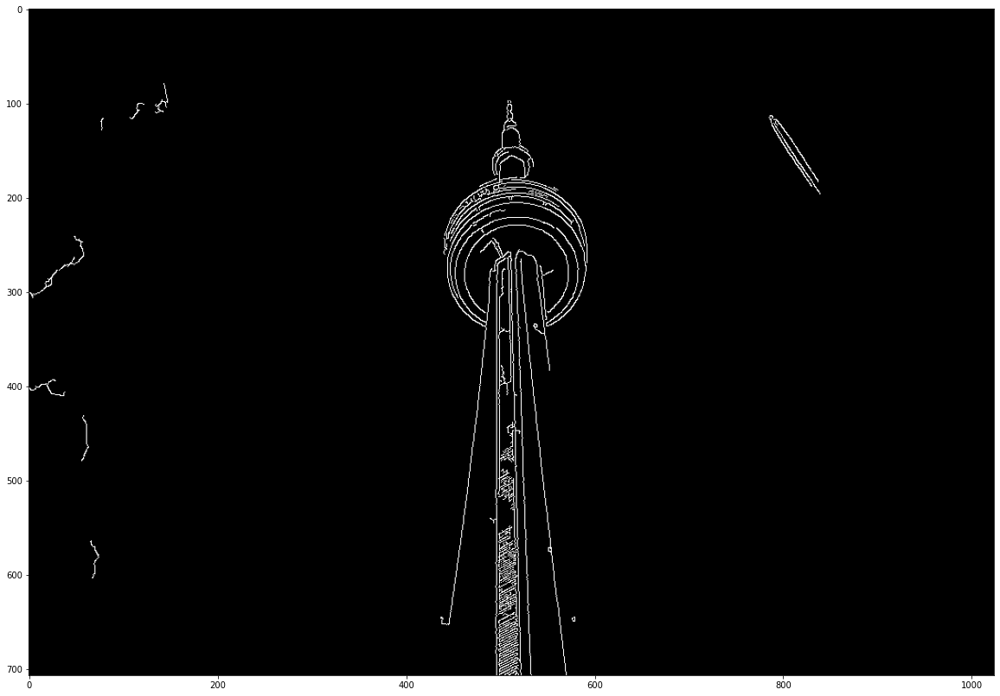

In [ ]:
gaussian_smoothed6 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge6 = cv2.Canny(gaussian_smoothed6, 30, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge6, cmap="gray")

***K = 3 , L = 50 , H = 80***

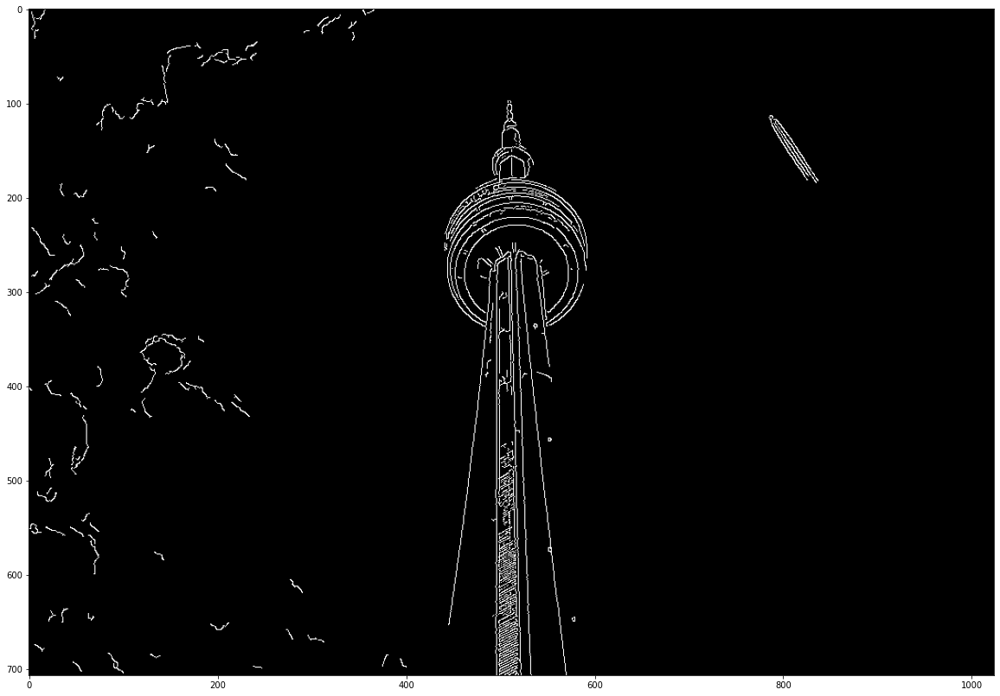

In [ ]:
gaussian_smoothed7 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge7 = cv2.Canny(gaussian_smoothed7, 50, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge7, cmap="gray")

***K = 3 , L = 50 , H = 100***

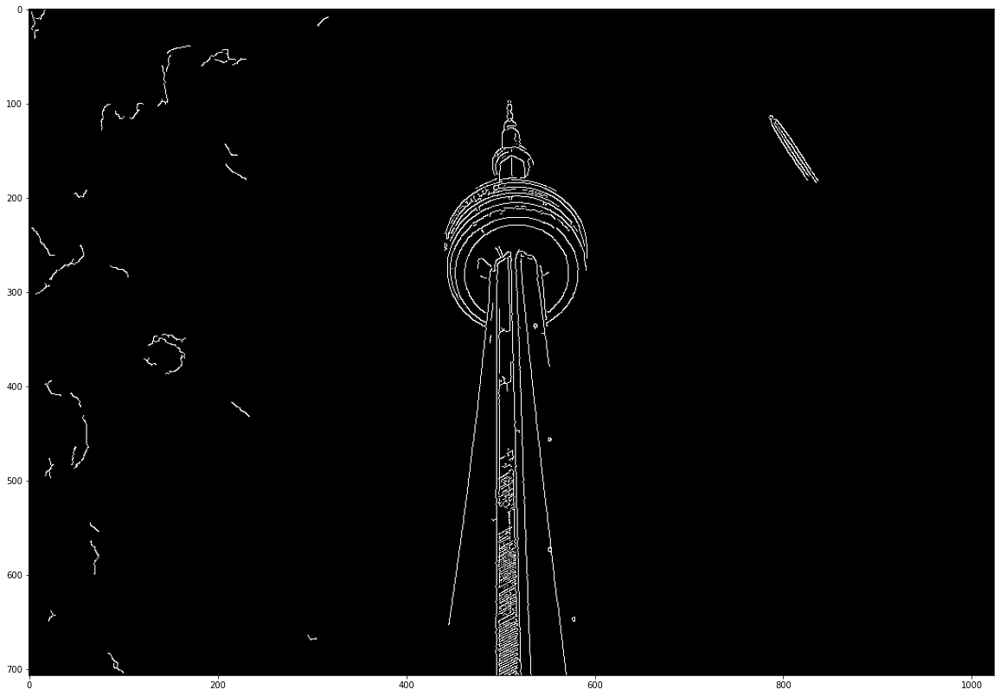

In [ ]:
gaussian_smoothed8 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge8 = cv2.Canny(gaussian_smoothed8, 50, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge8, cmap="gray")

***K = 3 , L = 50 , H = 150***

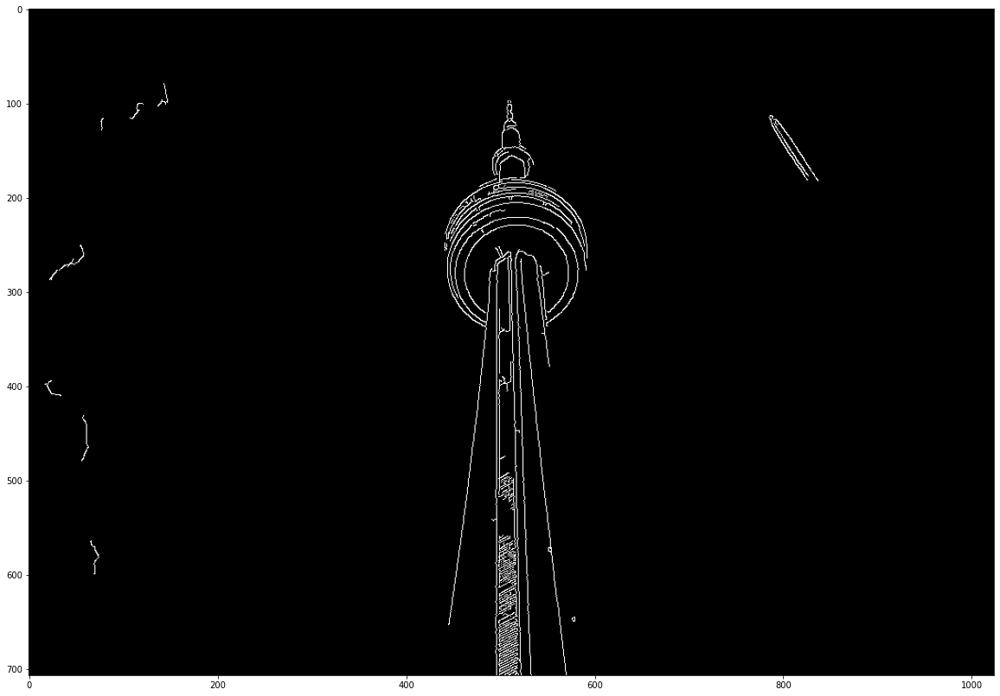

In [ ]:
gaussian_smoothed9 = cv2.GaussianBlur(tower_image,(3,3),1)
canny_edge9 = cv2.Canny(gaussian_smoothed9, 50, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge9, cmap="gray")

***K = 5 , L = 10 , H = 80***

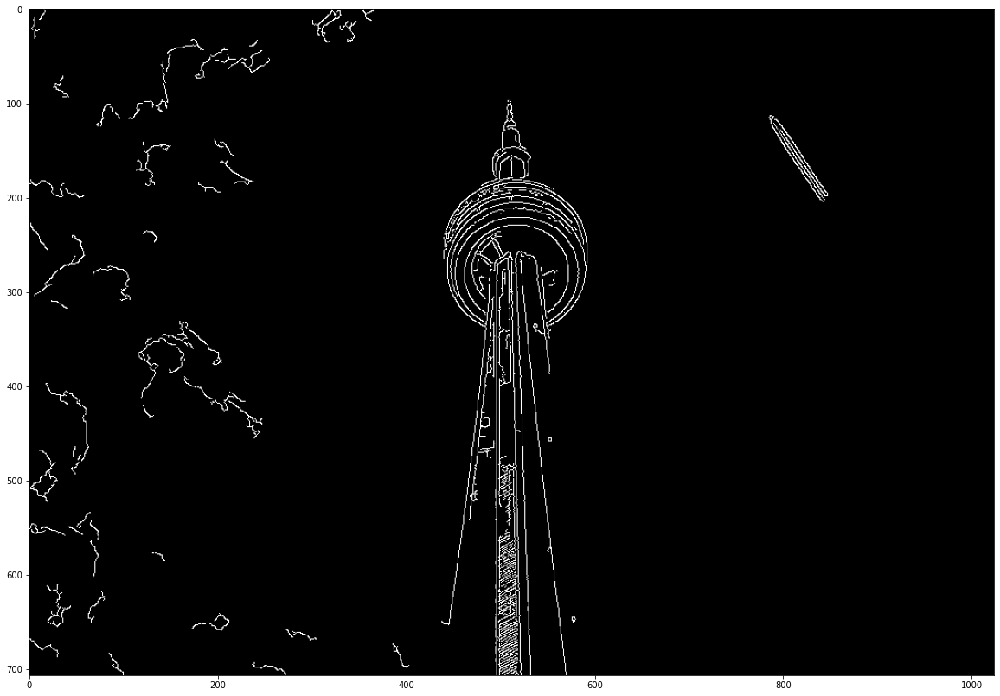

In [ ]:
gaussian_smoothed10 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge10 = cv2.Canny(gaussian_smoothed10, 10, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge10, cmap="gray")

***K = 5 , L = 10 , H = 100***

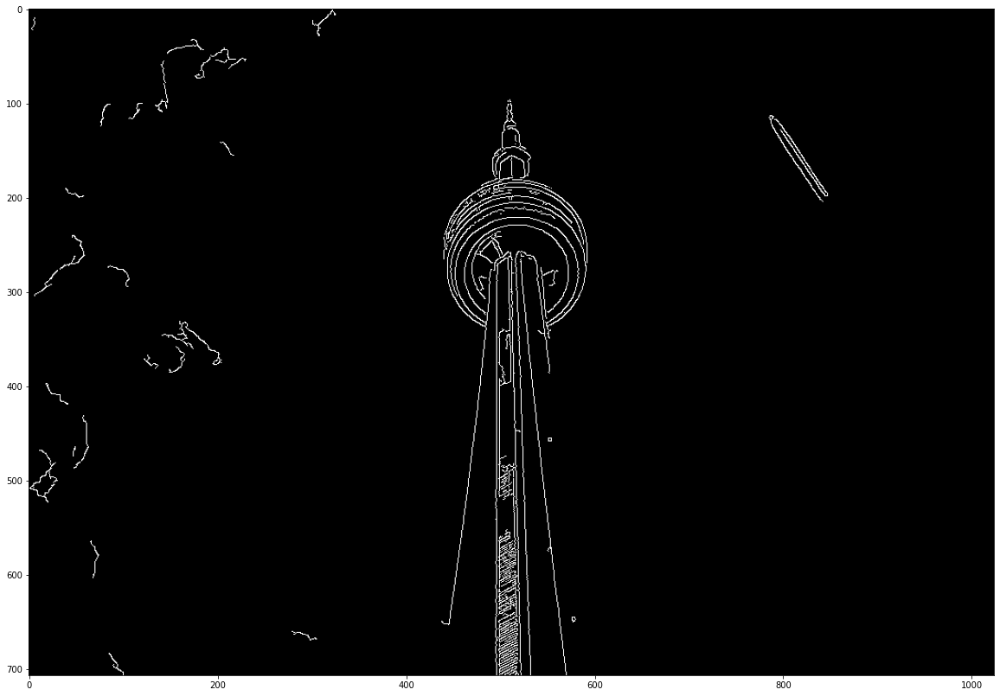

In [ ]:
gaussian_smoothed11 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge11 = cv2.Canny(gaussian_smoothed11, 10, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge11, cmap="gray")

***K = 5 , L = 10 , H = 150***

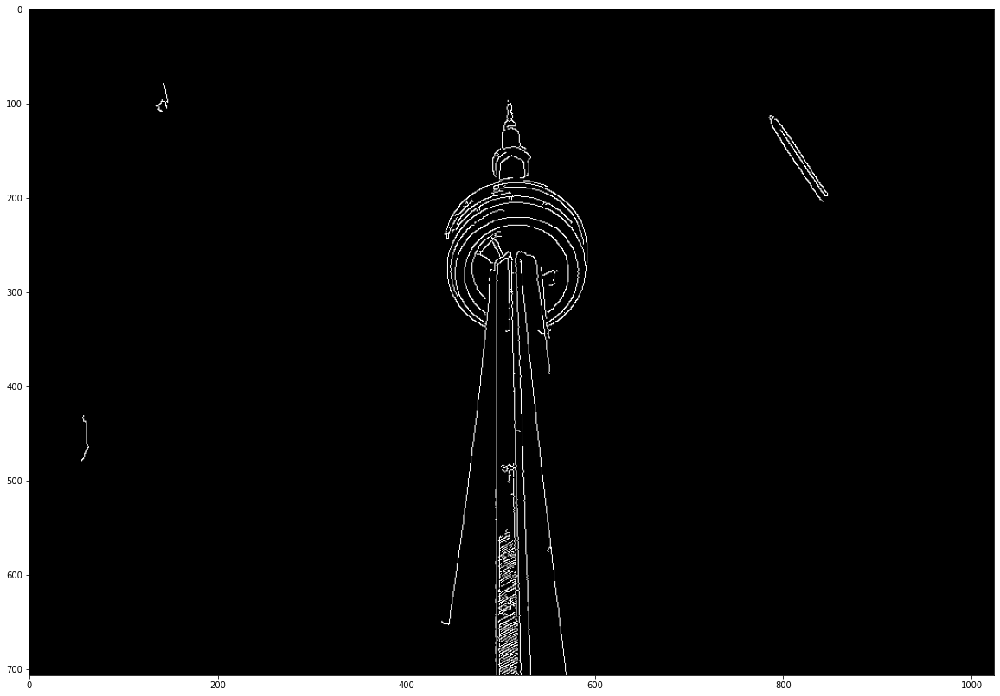

In [ ]:
gaussian_smoothed12 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge12 = cv2.Canny(gaussian_smoothed12, 10, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge12, cmap="gray")

***K = 5 , L = 30 , H = 80***

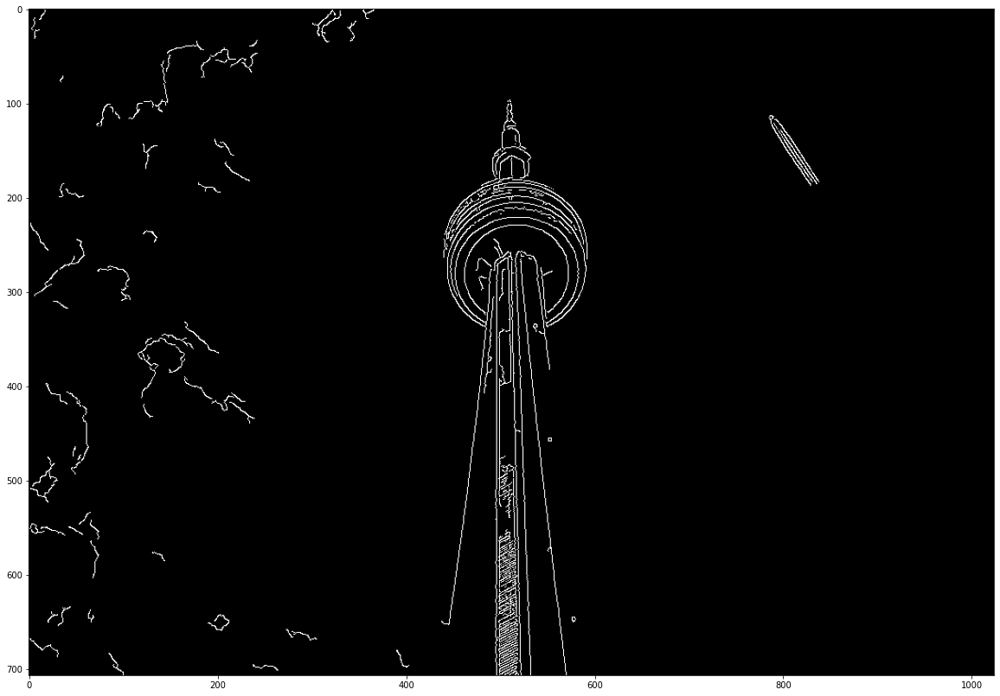

In [ ]:
gaussian_smoothed13 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge13 = cv2.Canny(gaussian_smoothed13, 30, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge13, cmap="gray")

***K = 5 , L = 30 , H = 100***

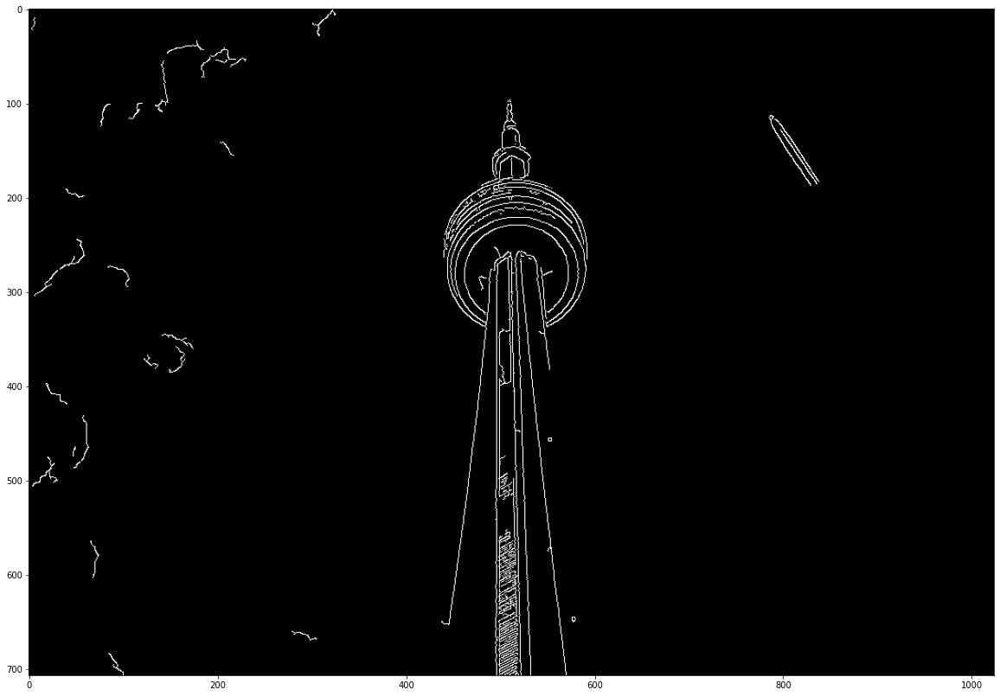

In [ ]:
gaussian_smoothed14 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge14 = cv2.Canny(gaussian_smoothed14, 30, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge14, cmap="gray")

***K = 5 , L = 30 , H = 150***

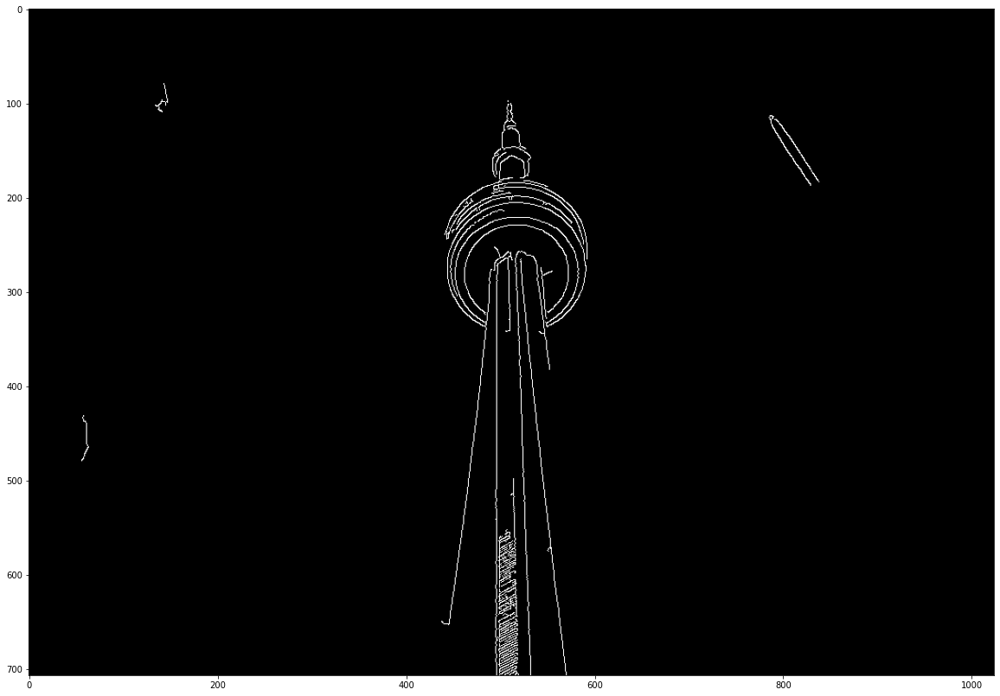

In [ ]:
gaussian_smoothed15 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge15 = cv2.Canny(gaussian_smoothed15, 30, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge15, cmap="gray")

***K = 5 , L = 50 , H = 80***

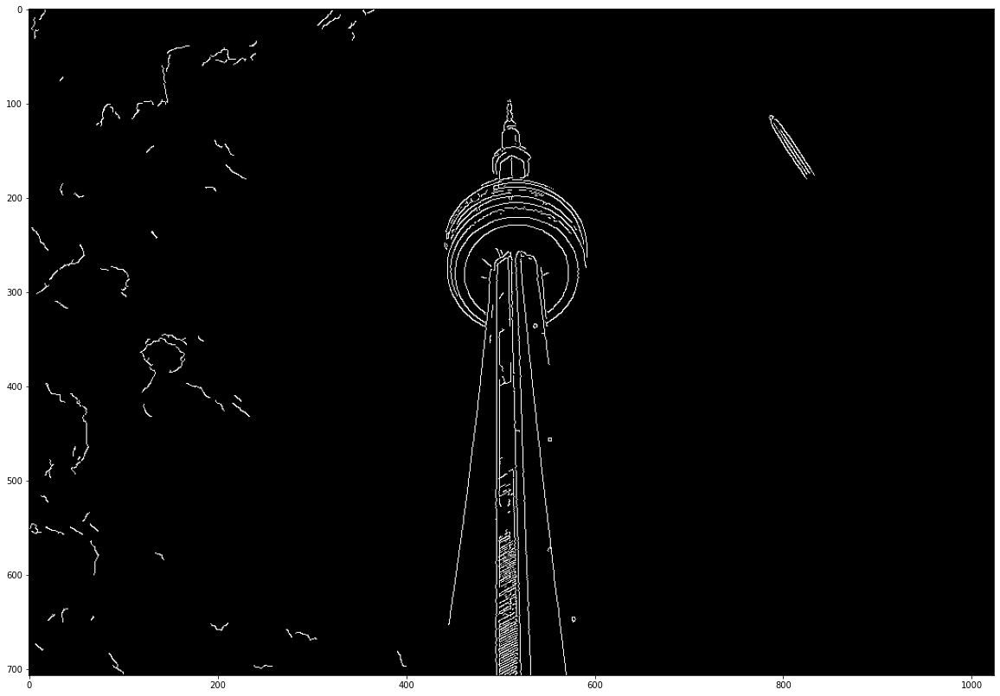

In [ ]:
gaussian_smoothed16 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge16 = cv2.Canny(gaussian_smoothed16, 50, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge16, cmap="gray")

***K = 5 , L = 50 , H = 100***

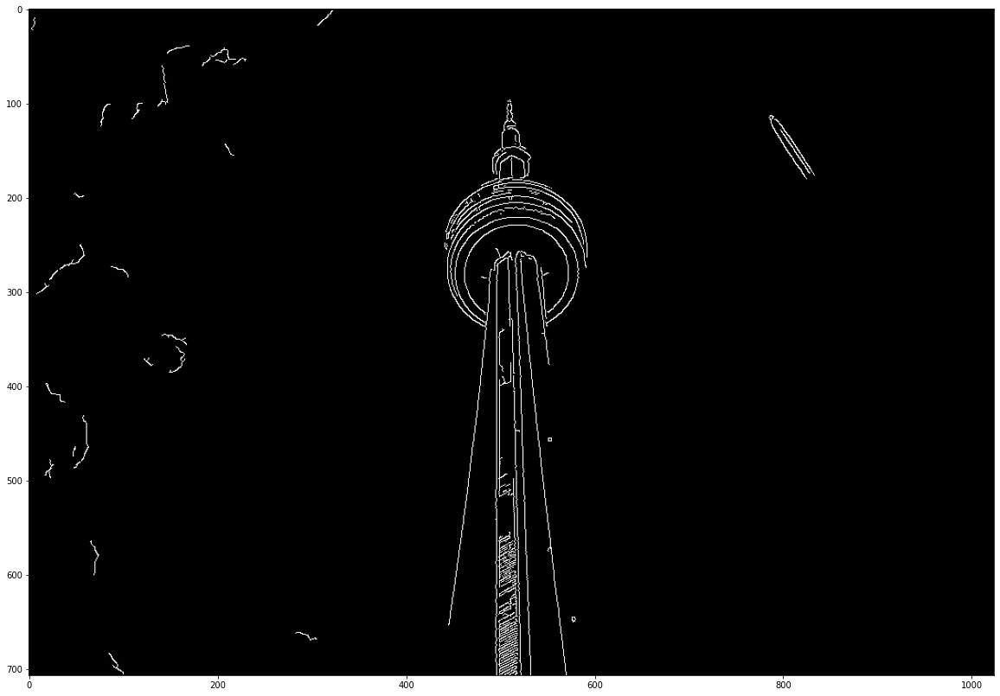

In [ ]:
gaussian_smoothed17 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge17 = cv2.Canny(gaussian_smoothed17, 50, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge17, cmap="gray")

***K = 5 , L = 50 , H = 150***

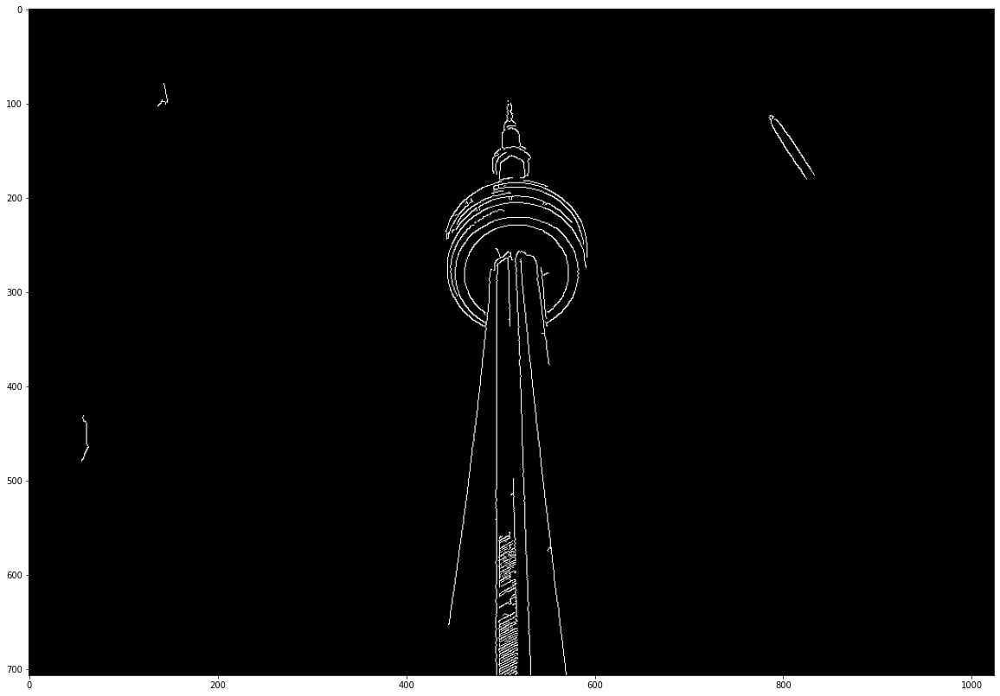

In [ ]:
gaussian_smoothed18 = cv2.GaussianBlur(tower_image,(5,5),1)
canny_edge18 = cv2.Canny(gaussian_smoothed18, 50, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge18, cmap="gray")

***K = 13 , L = 10 , H = 80***

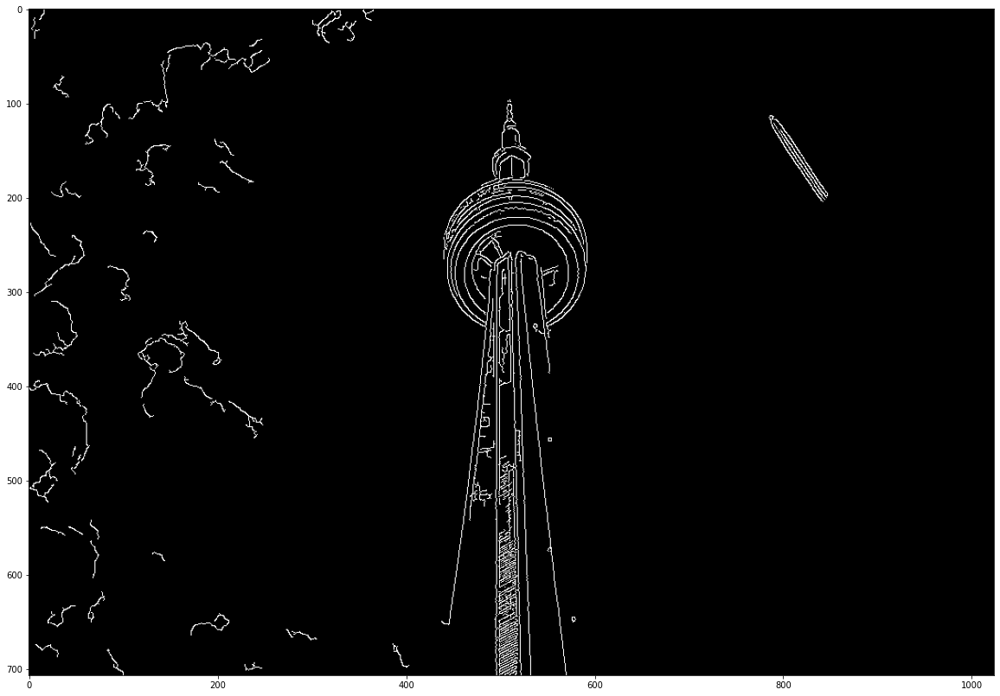

In [ ]:
gaussian_smoothed19 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge19 = cv2.Canny(gaussian_smoothed19, 10, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge19, cmap="gray")

***K = 13 , L = 10 , H = 100***

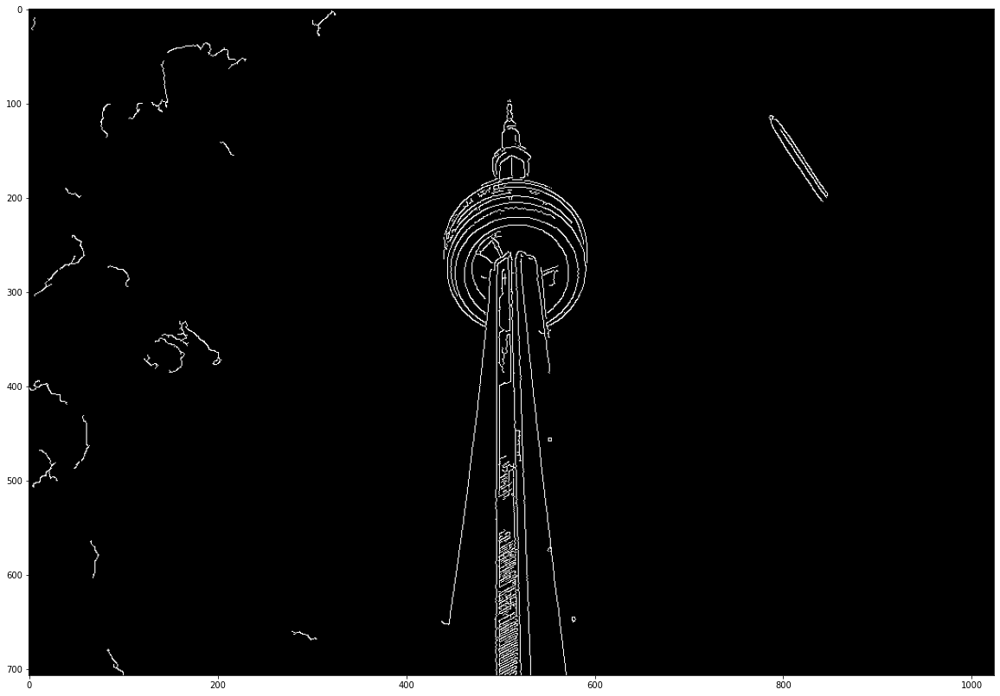

In [ ]:
gaussian_smoothed20 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge20 = cv2.Canny(gaussian_smoothed20, 10, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge20, cmap="gray")

***K = 13 , L = 10 , H = 150***

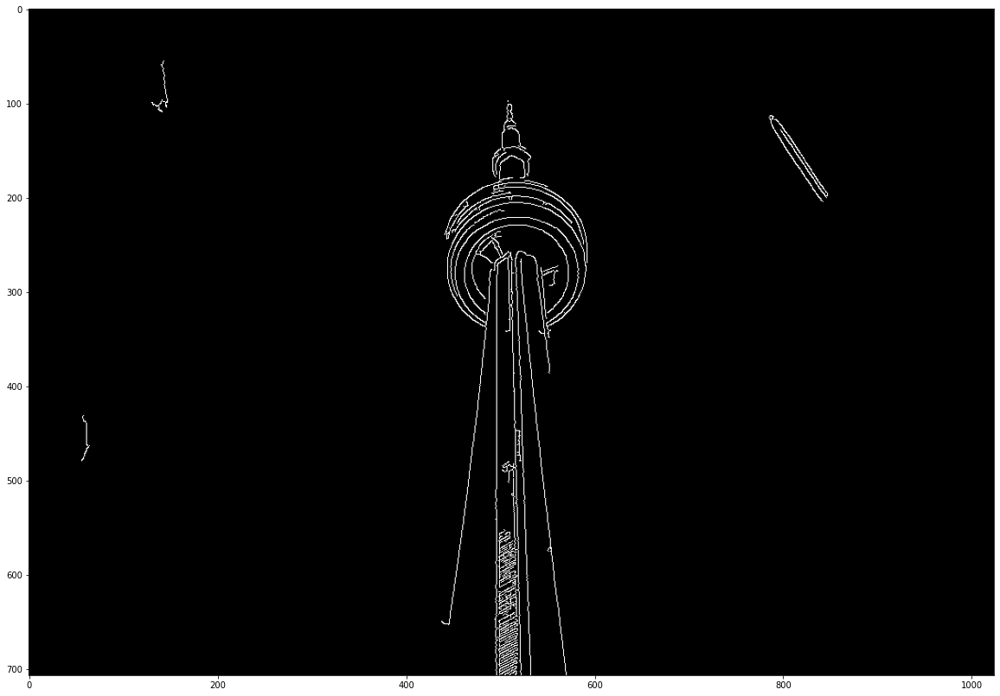

In [ ]:
gaussian_smoothed21 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge21 = cv2.Canny(gaussian_smoothed21, 10, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge21, cmap="gray")

***K = 13 , L = 30 , H = 80***

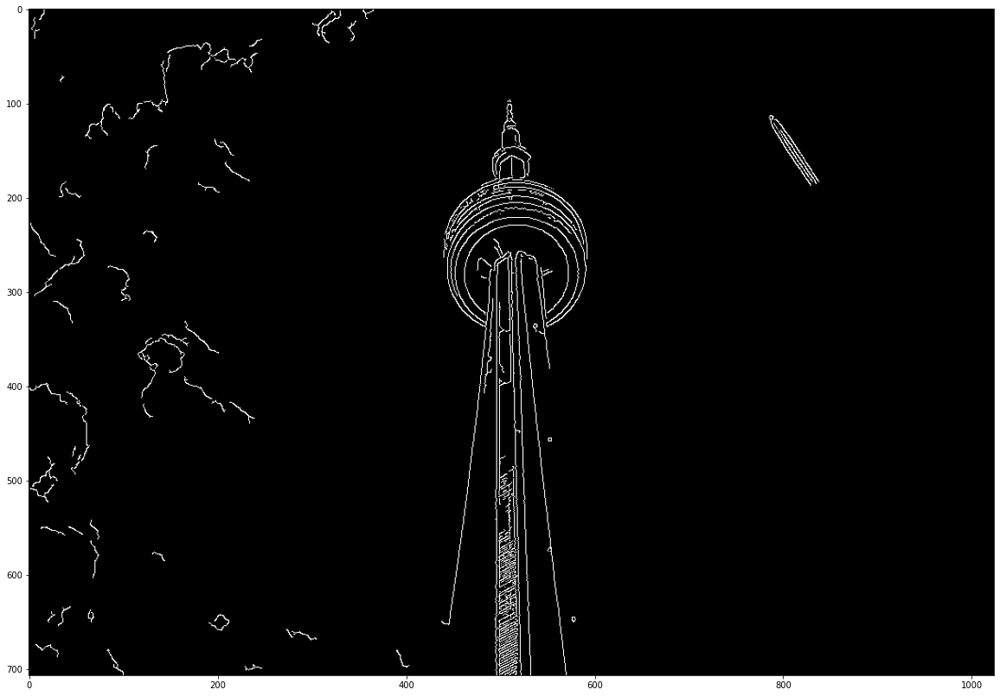

In [ ]:
gaussian_smoothed22 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge22 = cv2.Canny(gaussian_smoothed22, 30, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge22, cmap="gray")

***K = 13 , L = 30 , H = 100***

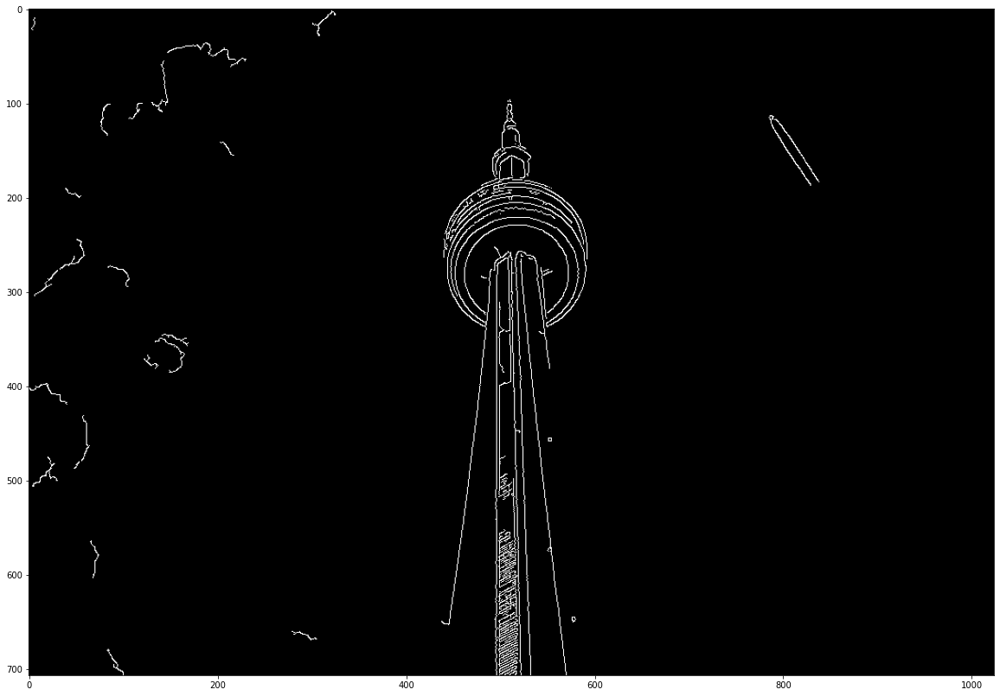

In [ ]:
gaussian_smoothed23 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge23 = cv2.Canny(gaussian_smoothed23, 30, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge23, cmap="gray")

***K = 13 , L = 30 , H = 150***

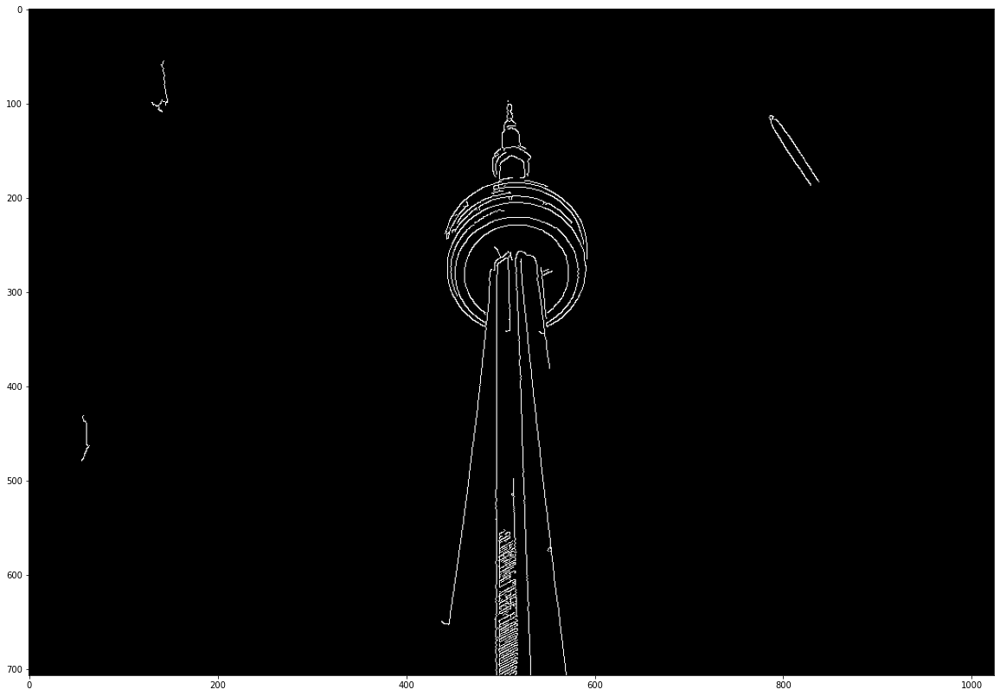

In [ ]:
gaussian_smoothed24 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge24 = cv2.Canny(gaussian_smoothed24, 30, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge24, cmap="gray")

***K = 13 , L = 50 , H = 80***

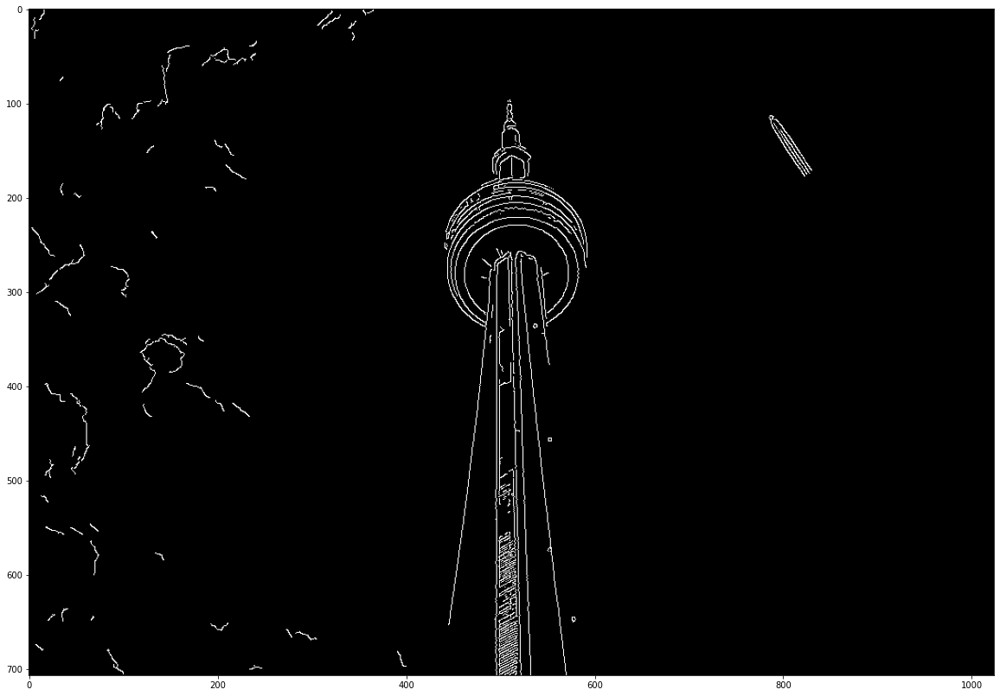

In [ ]:
gaussian_smoothed25 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge25 = cv2.Canny(gaussian_smoothed25, 50, 80)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge25, cmap="gray")

***K = 13 , L = 50 , H = 100***

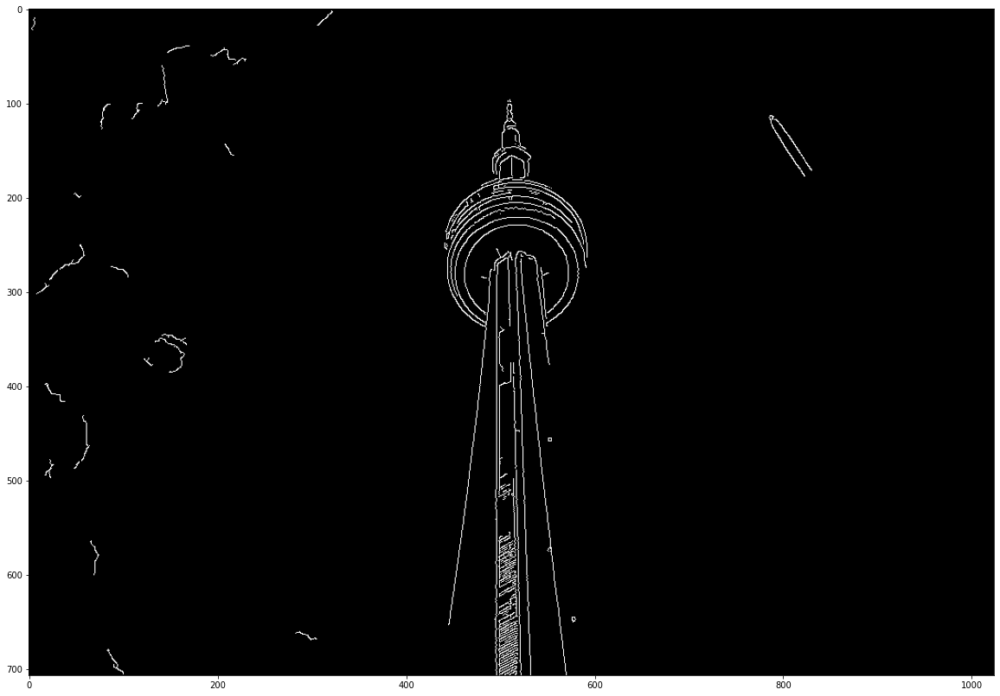

In [ ]:
gaussian_smoothed26 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge26 = cv2.Canny(gaussian_smoothed26, 50, 100)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge26, cmap="gray")

***K = 13 , L = 50 , H = 150***

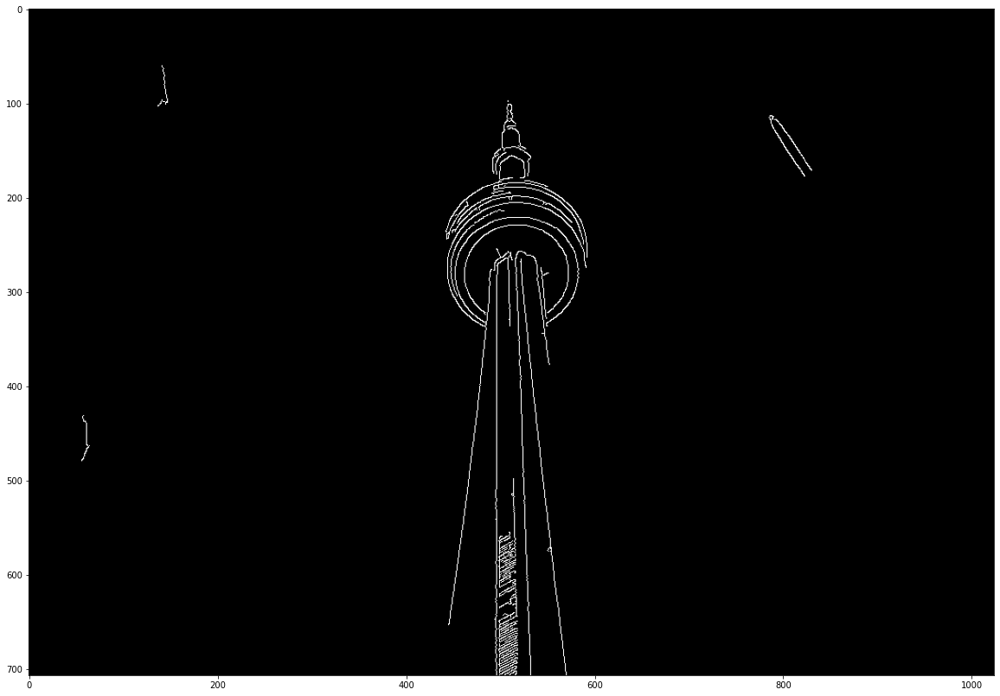

In [ ]:
gaussian_smoothed27 = cv2.GaussianBlur(tower_image,(13,13),1)
canny_edge27 = cv2.Canny(gaussian_smoothed27, 50, 150)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge27, cmap="gray")

# **2.3 Describe how changing values of each parameter (K, L, U) affects the overall edge detection results. Is there any relationship between parameters?**

1.  In Canny Edge detection, the kernel size (K) affects the strenght of the smoothing in the original image. A bigger kernel results in stronger smoothing and a smaller kernel results in less smoothing. The kernel size also controls the level of noise sensitivity (more sensitive to noise with smaller kernels), edge detection (detects edges better with bigger kernels) and localization the output image (localization isn't as good with small kernel as with big kernels)

2.  The lower threshold (L) and higher threshold (H) are the minimum and maximum intensity gradients that are considered as edges. Edges with gradient magnitudes below the lower threshold will be discarded, while edges with gradient magnitudes above the higher threshold will be marked as strong edges. Edges with gradient magnitudes between the two thresholds will be marked as weak edges and may or may not be included in the final edge map, depending on the presence of strong edges nearby.

3. Those parameters have a relationship between each other: increasing L results in more detected edges and increasing H results in more edges being detected. The choice of kernel size may also affect the results, as larger kernel sizes result in stronger smoothing and may reduce the amount of high-frequency information in the image, while smaller kernel sizes may preserve more detail but may also result in increased noise and false edges.


source: course notes and suggested book reading on the syllabus:

Computer Vision: Algorithms and Applications, by Richard Szeliski, Springer 2010


# **2.4 Combine parameters in such a way that edges related to the CN tower are detected and other edges removed**

The parameters that worked best for only detecting the edges of the CN tower while removing all other edges were K = 17x17, L = 10 and H = 200. This worked well because the gaussian filter was big enough to blur small non-important noise, the higher threshold was set so high that only the contrasting edges of the tower were picked up and the lower threshold was really low, allowing for the strong edges to be continued. The difficult part in setting the parameters here is to chose a compromise between being able to pick up the most edges related to the CN tower while having thresholds that delete other edges.

(<matplotlib.image.AxesImage at 0x7f9e34a1df40>,
 Text(0.5, 1.0, 'Parameters allowing to only keep the edges of the CN tower'))

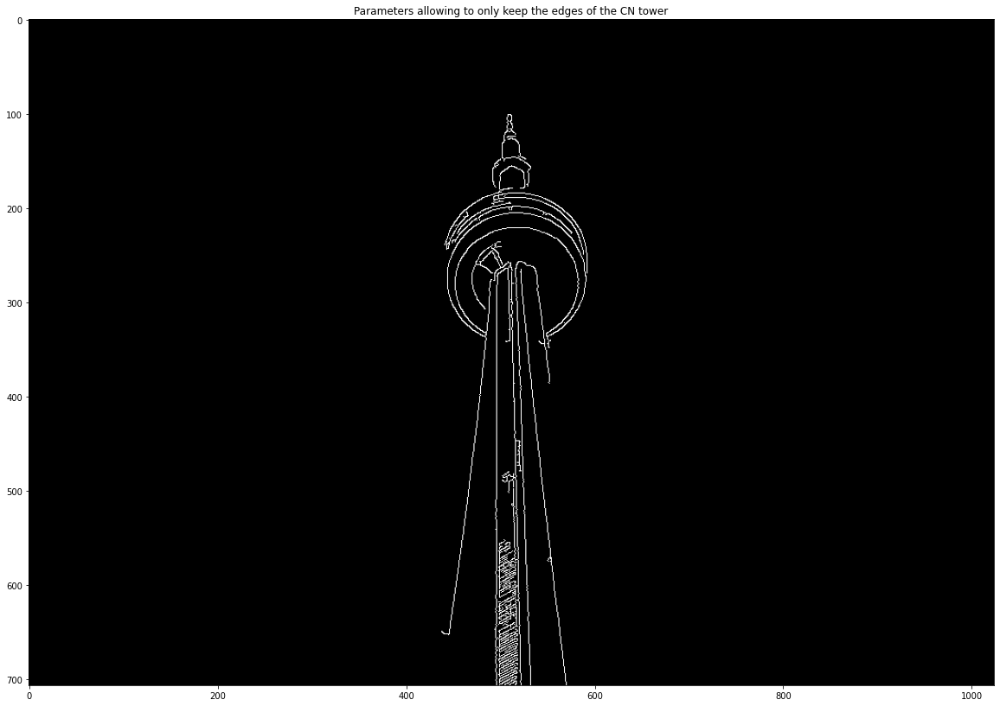

In [ ]:
# output with best parameters to eliminate the CN tower edges (K=17, L=10, H=200)
gaussian_smoothed28 = cv2.GaussianBlur(tower_image,(17,17),1)
canny_edge28 = cv2.Canny(gaussian_smoothed28, 10, 200)
plt.figure(figsize=(20, 20))
plt.imshow(canny_edge28, cmap="gray"), plt.title("Parameters allowing to only keep the edges of the CN tower")

# **3. Harris Corner Detection**

***HELPER FUNCTION FOR NON-MAXIMUM SUPPRESSION***

In [ ]:
# the main idea of the function is really based on tutorial 3 and on the lecture
# The code however, is different

def nms(image):

  H, W = image.shape

  # calculate the derivatives
  I_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
  I_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

  # get the phase/magnitude
  magnitude = cv2.magnitude(I_x, I_y)
  # I put it on 180, otherwise, there are too many decimals with fractions of PI
  phase = np.arctan2(I_x,I_y)*180/np.pi
  # to avoid having negative angles, add 180 if smaller than 0
  phase = np.where(phase<0, phase+180, phase)

  # normalize
  magnitude = magnitude/magnitude.max()*255

  # create the new image array
  max_suppressed = np.zeros((H,W))

  for i in range (1, H-1):
    for j in range (1, W-1):

      angle = phase[i][j]
      q = magnitude[i][j]

      # 22.5 degrees corresponds to pi/8
      # p and r are the neighbouring pixels
      if (0 <= angle < 22.5) or (157.5 <= angle < 180):
        p = magnitude[i, j+1]
        r = magnitude[i, j-1]
      elif (22.5 <= angle < 67.5):
        p = magnitude[i+1,j-1]
        r = magnitude[i-1,j+1]
      elif (67.5 <= angle < 112.5):
        p = magnitude[i+1, j]
        r = magnitude[i-1, j]
      elif (112.5 <= angle < 157.5):
        p = magnitude[i-1, j-1]
        r = magnitude[i+1, j+1]

      max_suppressed[i,j] = q if (q >= p and q >= r) else 0

  return max_suppressed

***CORNER DETECTION***

In [ ]:
def detectCorners(threshold1, threshold2, threshold3):
  # information about Harris corner detection was found in Lecture 5
  # on this website: https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html
  # and on this website: https://muthu.co/harris-corner-detector-implementation-in-python/#:~:text=The%20Harris%20corner%20detection%20algorithm,in%20more%20than%20one%20direction.

  # load the images
  maze_image = cv2.imread(path+"template_board.png")
  shape_image = cv2.imread(path+"shapes.png")
  building_image = cv2.imread(path+"courthouse.jpg")

  # this step was reminded in the tutorials
  # convert from BGR to RGB
  maze_image = cv2.cvtColor(maze_image, cv2.COLOR_BGR2RGB)
  shape_image = cv2.cvtColor(shape_image, cv2.COLOR_BGR2RGB)
  building_image = cv2.cvtColor(building_image, cv2.COLOR_BGR2RGB)

  # convert the images to grayscale
  maze_image_gray = cv2.cvtColor(maze_image, cv2.COLOR_RGB2GRAY)
  shape_image_gray = cv2.cvtColor(shape_image, cv2.COLOR_RGB2GRAY)
  building_image_gray = cv2.cvtColor(building_image, cv2.COLOR_RGB2GRAY)

  # compute the image derivatives using the sobel filter
  # Detailed information of the Sobel filter was found on the OpenCV website:
  # https://docs.opencv.org/3.4/d2/d2c/tutorial_sobel_derivatives.html

  I_x_maze = cv2.Sobel(maze_image_gray, cv2.CV_64F, 1, 0, ksize=3)
  I_y_maze = cv2.Sobel(maze_image_gray, cv2.CV_64F, 0, 1, ksize=3)

  I_x_shape = cv2.Sobel(shape_image_gray, cv2.CV_64F, 1, 0, ksize=3)
  I_y_shape = cv2.Sobel(shape_image_gray, cv2.CV_64F, 0, 1, ksize=3)

  I_x_building = cv2.Sobel(building_image_gray, cv2.CV_64F, 1, 0, ksize=3)
  I_y_building = cv2.Sobel(building_image_gray, cv2.CV_64F, 0, 1, ksize=3)

  # compute the square of the derivatives and gaussian filter it
  I_xx_maze = cv2.GaussianBlur(I_x_maze**2, (3,3), 1)
  I_xy_maze = cv2.GaussianBlur(I_x_maze*I_y_maze, (3,3), 1)
  I_yy_maze = cv2.GaussianBlur(I_y_maze**2, (3,3), 1)

  I_xx_shape = cv2.GaussianBlur(I_x_shape**2, (3,3), 1)
  I_xy_shape = cv2.GaussianBlur(I_x_shape*I_y_shape, (3,3), 1)
  I_yy_shape = cv2.GaussianBlur(I_y_shape**2, (3,3), 1)

  I_xx_building = cv2.GaussianBlur(I_x_building**2, (3,3), 1)
  I_xy_building = cv2.GaussianBlur(I_x_building*I_y_building, (3,3), 1)
  I_yy_building = cv2.GaussianBlur(I_y_building**2, (3,3), 1)

  # compute the determinants and the traces
  det_maze = I_xx_maze*I_yy_maze - I_xy_maze**2
  trace_maze = I_xx_maze + I_yy_maze

  det_shape = I_xx_shape*I_yy_shape - I_xy_shape**2
  trace_shape = I_xx_shape + I_yy_shape

  det_building = I_xx_building*I_yy_building - I_xy_building**2
  trace_building = I_xx_building + I_yy_building

  # compute the cornerness function
  K = 0.05
  har_maze = det_maze-K*trace_maze**2
  har_shape = det_shape-K*trace_shape**2
  har_building = det_building-K*trace_building**2

  # normalize the corner images, to have thresholds between 0 and 1
  # more info about cv2.normalize was found at:
  # https://shimat.github.io/opencvsharp_docs/html/97f114d7-07ab-c3d8-d9a3-20fbcd2f1b38.htm
  cv2.normalize(har_maze, har_maze, 0, 1, cv2.NORM_MINMAX)
  cv2.normalize(har_shape, har_shape, 0, 1, cv2.NORM_MINMAX)
  cv2.normalize(har_building, har_building, 0, 1, cv2.NORM_MINMAX)

  corner_maze = np.where(har_maze > threshold1, har_maze, 0)
  corner_shape = np.where(har_shape > threshold2, har_shape,0)
  corner_building = np.where(har_building > threshold3, har_building, 0)

  # perform non-maximum suppression
  nms_maze = nms(corner_maze)
  nms_shape = nms(corner_shape)
  nms_building = nms(corner_building)

  # loop though points
  # the idea to use cv2.circle was taken from the tutorial and more information was found at:
  # https://www.geeksforgeeks.org/python-opencv-cv2-circle-method/

  def insert_dots(image, original_image):
    for y in range(image.shape[0]):
      for x in range(image.shape[1]):
        if image[y,x]>0:
          cv2.circle(original_image, (x,y), 3, (255,0,0),-1)

  insert_dots(nms_maze, maze_image)
  insert_dots(nms_shape, shape_image)
  insert_dots(nms_building, building_image)

  # display everything
  fig = plt.figure(figsize=(30,30))
  fig.add_subplot(3,1,1)
  plt.imshow(maze_image, cmap="gray")

  fig.add_subplot(3,1,2)
  plt.imshow(shape_image, cmap="gray")

  fig.add_subplot(3,1,3)
  plt.imshow(building_image, cmap="gray")

***CALL THE HARRIS DETECTION FUNCTION WITH DIFFERENT THRESHOLDS***

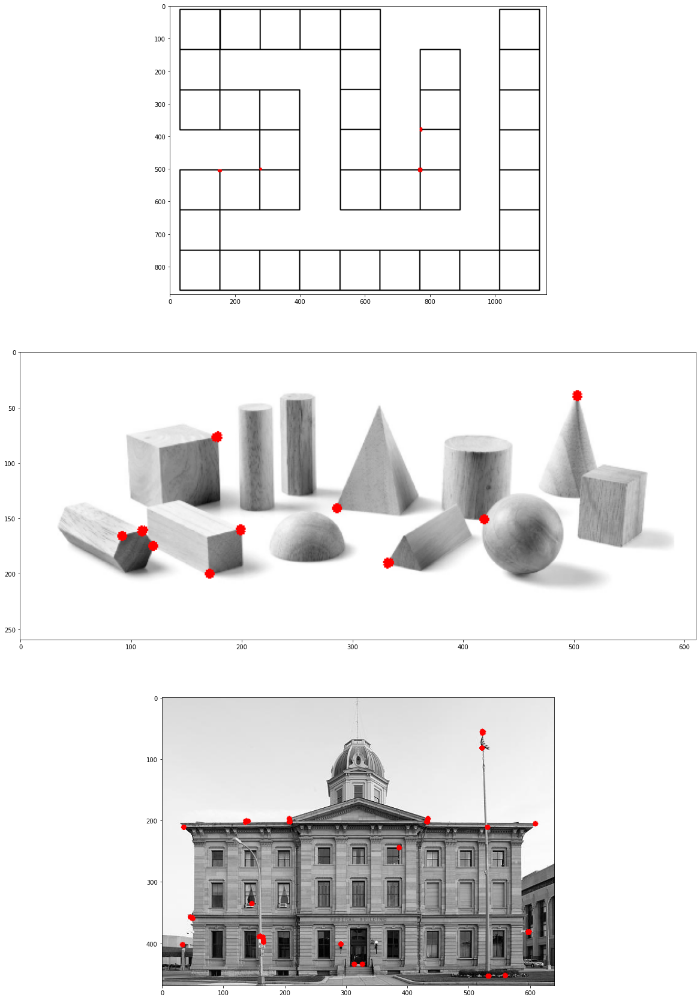

In [ ]:
### TRIAL 1 ###

# too high, decrease the threshold
threshold1 = 0.9
# this one was decreased a little bit to pick up more corners
threshold2 = 0.75
# this one was also increased
threshold3 = 0.4

detectCorners(threshold1,threshold2,threshold3)

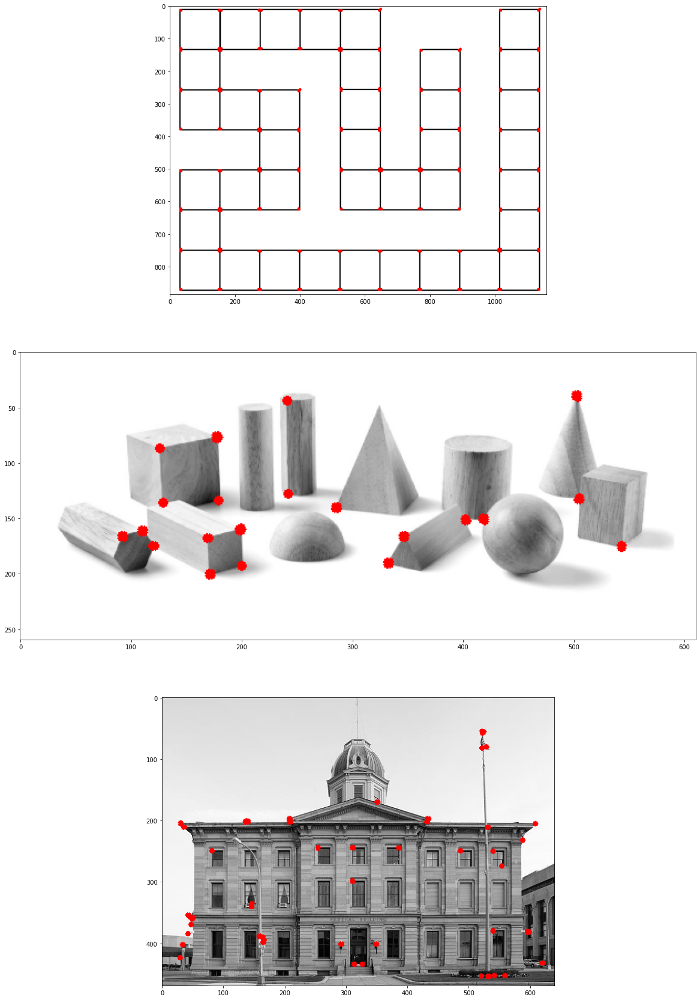

In [ ]:
### TRIAL 2 ###

# this one seems similar to figure 6
threshold1 = 0.5
# this one was decreased a little bit to pick up more corners
threshold2 = 0.65
# this one was also decreased
threshold3 = 0.35

detectCorners(threshold1,threshold2,threshold3)

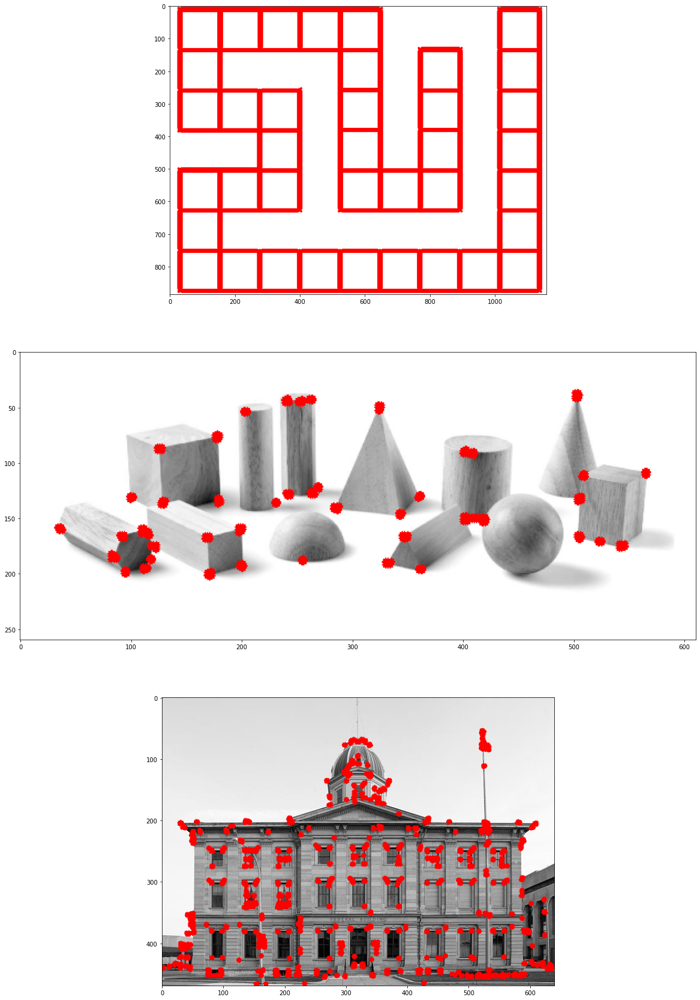

In [ ]:
### TRIAL 3 ###

# this one seemed ok but see what happens if you lower it:
# not good!
threshold1 = 0.1
# decreased threshold
threshold2 = 0.60
# decreased threshold
threshold3 = 0.25

detectCorners(threshold1,threshold2,threshold3)

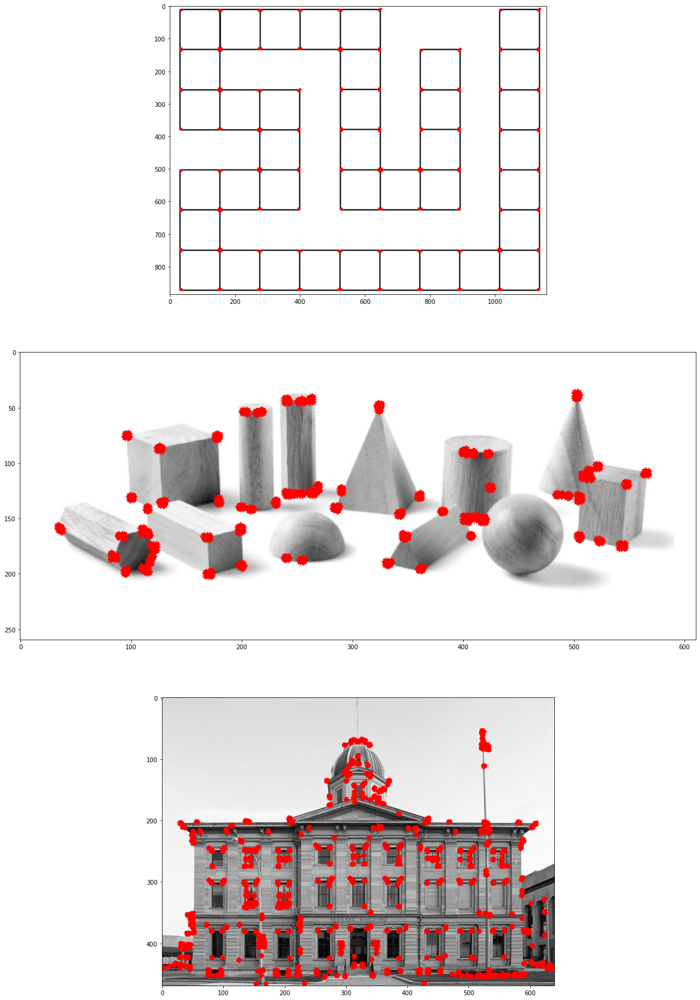

In [ ]:
### TRIAL 4 ###

# reset to 0.5
threshold1 = 0.5
# decreased threshold
threshold2 = 0.595
# keep same threshold
threshold3 = 0.25

detectCorners(threshold1,threshold2,threshold3)

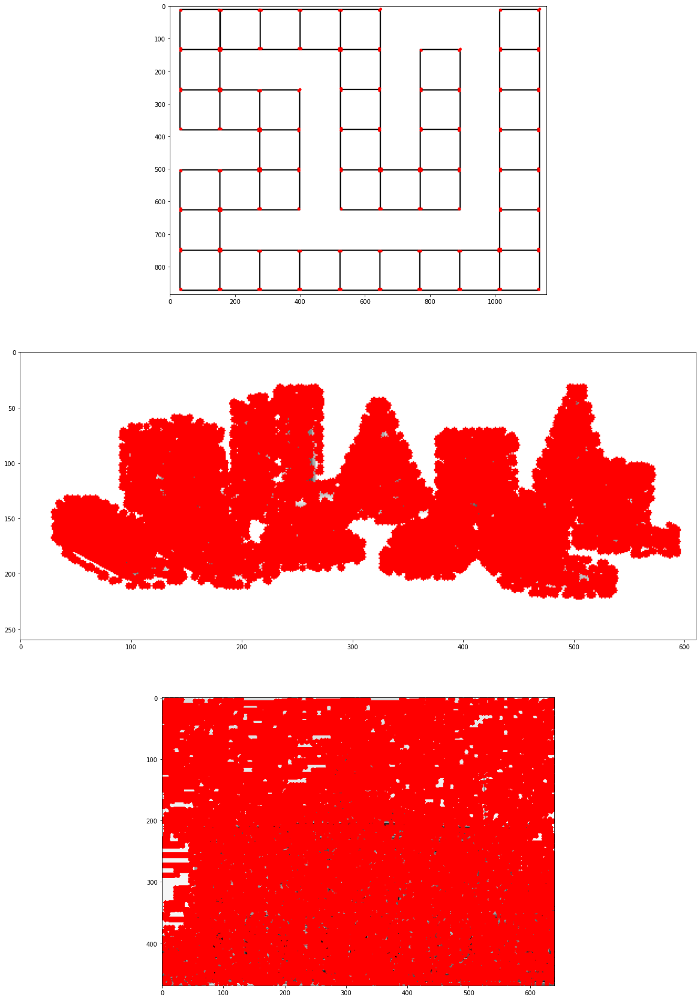

In [ ]:
### TRIAL 5 ###

# back to 0.5
threshold1 = 0.5
# see what threshold results in too many corners
threshold2 = 0.59
# see what threshold results in too many corners
threshold3 = 0.20

detectCorners(threshold1,threshold2,threshold3)

# **ANALYSIS:**

It is to note here that all threshold are on a scale from 0 to 1 (i.e. the corner images were normalized to 1)

1. MAZE IMAGE: Changing the threshold in the harris corner detection algorithm changes the number of detected corners. A higher threshold results in less corners being detected while a lower threshold has the opposite effect. The threshold also has a role of controlling the quality of the corners being detected. As can be seen from trial 1, a too low threshold accepts corners that have a lower quality and that look more like noise. Trial 1 had a threshold of 0.9, which was too high and did not capture all the corners in the maze. On the other hand, a threshold of 0.1 in trial 3, was too low and captured points that were not corners. A good balance between sensitivity and specificity here was found to be 0.5. This result was similar to the reference image. The circles representing the corners were smaller, but that is not because of the algorithm itself, it is only the radius setting of the circles in the detectCorners function.

2. SHAPE IMAGE: The first threshold that was tried was 0.9. As can be seen from trial 1, the sensitivity was not high enough as some corners were not detected. To remedy to this problem, the threshold was decreased to a value of 0.65. This significantly improved the result and the corners detected were effectively observable corners in the image (good specificity). However, many corners were still missing. To try to get more corners, the threshold was set to 0.6. With this threshold most of the corners were detected and only the corners that had a low contrast in the image were still missing. However, going from 0.6 to 0.59, as can be seen in trial 5 had a huge impact on the quality of the corners detected: the detection was not specific enough. This indicates that 0.6 is a good balance between a good sensitivity and a good specificity.

3. BUILDING IMAGE: A first threshold was set to 0.4. Surprisingly, this relatively low threshold did not allow to capture most of the corners in the building. This might be because the building itself is very dark. In trial 2, this threshold was changed to 0.35, but this did not have the expected effect as the sensitivity was still too high. Setting this threshold to 0.25 allowed to capture most of the observable corners in the image. A lower value of 0.20 in trial 5 demonstrated that 0.25 is a good balance between having enough corners being detected and having corners of high quality.

# **4. Invariance of SIFT Features**

**4.1 The 4 main steps in the SIFT method are the following:**

1- Identify the local extrema in the scale-space representation of the image (find distinctive features at multiple scales of the image). This is done by creating a Difference of Gaussian (DoG) pyramid and detecting extrema by comparing the value of a pixel with its neighbors in the same scale and in the scales above and below.

2- Refine the selection to filter out keypoints that lie along an edge or that have low contrast using an approach similar to the Harris corner detection.

3- To make the feature descriptors invariant to rotation, assign a canonical orientation to each keypoint

4- Create a descriptor for each keypoint by constructing an histogram of 8 gradient orientations spaced by 45 degrees, in the local neighbourhood around the keypoint (relative to the dominant orientation) and keeping in memory the location scale and orientation of the keypoint.

sources: course notes and https://medium.com/data-breach/introduction-to-sift-scale-invariant-feature-transform-65d7f3a72d40

**4.2 Invariance under scale**

(<matplotlib.image.AxesImage at 0x7f471bce6b20>,
 Text(0.5, 1.0, 'matching of reference image and image scaled by 5'))

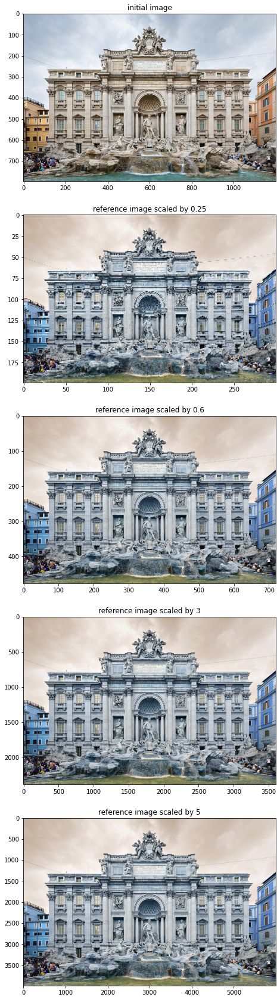

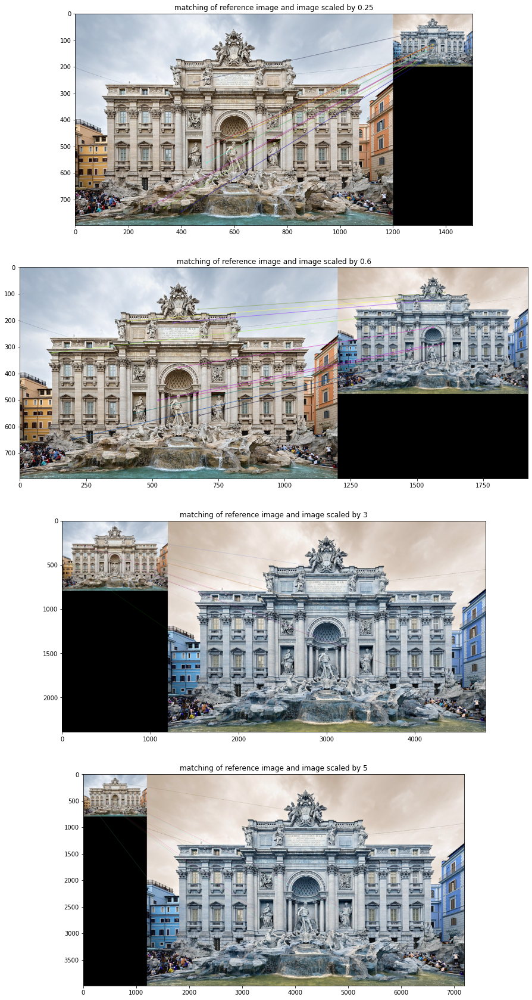

In [ ]:
# load the trevi fountain image
trevi_image = cv2.imread(path+"TreviFountainRome.jpg")
img = trevi_image.copy()

# change from BGR to RGB
img = cv2.cvtColor(trevi_image, cv2.COLOR_BGR2RGB)
H,W,N = trevi_image.shape

# scale the reference image at different scales
scaled_img1 = cv2.resize(trevi_image, (int(0.25*W), int(0.25*H)), interpolation = cv2.INTER_LINEAR)
scaled_img2 = cv2.resize(trevi_image, (int(0.6*W), int(0.6*H)), interpolation = cv2.INTER_LINEAR)
scaled_img3 = cv2.resize(trevi_image, (int(3*W), int(3*H)), interpolation = cv2.INTER_LINEAR)
scaled_img4 = cv2.resize(trevi_image, (int(5*W), int(5*H)), interpolation = cv2.INTER_LINEAR)

# display the 5 images
fig = plt.figure(figsize=(30,30))
fig.add_subplot(5,1,1)
plt.imshow(img), plt.title("initial image")

fig.add_subplot(5,1,2)
plt.imshow(scaled_img1), plt.title("reference image scaled by 0.25")

fig.add_subplot(5,1,3)
plt.imshow(scaled_img2), plt.title("reference image scaled by 0.6")

fig.add_subplot(5,1,4)
plt.imshow(scaled_img3), plt.title("reference image scaled by 3")

fig.add_subplot(5,1,5)
plt.imshow(scaled_img4), plt.title("reference image scaled by 5")

# create a SIFT object
sift_object = cv2.xfeatures2d.SIFT_create()

# select the SIFT features
keypoints, descriptors = sift_object.detectAndCompute(img, None)
keypoints1, descriptors1 = sift_object.detectAndCompute(scaled_img1, None)
keypoints2, descriptors2 = sift_object.detectAndCompute(scaled_img2, None)
keypoints3, descriptors3 = sift_object.detectAndCompute(scaled_img3, None)
keypoints4, descriptors4 = sift_object.detectAndCompute(scaled_img4, None)


# create a BF matcher object
# information about the brute force openCV function was taken from the openCV website:
# https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html
bf_object = cv2.BFMatcher()

matches1 = list(bf_object.match(descriptors, descriptors1))
matches2 = list(bf_object.match(descriptors, descriptors2))
matches3 = list(bf_object.match(descriptors, descriptors3))
matches4 = list(bf_object.match(descriptors, descriptors4))

# sort the matching keypoints according to matching distance
distance = lambda p:p.distance

matches1.sort(key = distance)
matches2.sort(key = distance)
matches3.sort(key = distance)
matches4.sort(key = distance)

# plot the top ten matched keypoints for each image pair
match_draw1 = cv2.drawMatches(img,keypoints,scaled_img1,keypoints1, matches1[:10], None, flags=2)
match_draw2 = cv2.drawMatches(img,keypoints,scaled_img2,keypoints2, matches2[:10], None, flags=2)
match_draw3 = cv2.drawMatches(img,keypoints,scaled_img3,keypoints3, matches3[:10], None, flags=2)
match_draw4 = cv2.drawMatches(img,keypoints,scaled_img4,keypoints4, matches4[:10], None, flags=2)

# display the matched images
# the setting flags=2, as shown in the tutorial, is used to avoid emphasizing all the keypoints in the image
fig = plt.figure(figsize=(30,30))
fig.add_subplot(4,1,1)
plt.imshow(match_draw1), plt.title("matching of reference image and image scaled by 0.25")

fig.add_subplot(4,1,2)
plt.imshow(match_draw2), plt.title("matching of reference image and image scaled by 0.6")

fig.add_subplot(4,1,3)
plt.imshow(match_draw3), plt.title("matching of reference image and image scaled by 3")

fig.add_subplot(4,1,4)
plt.imshow(match_draw4), plt.title("matching of reference image and image scaled by 5")

Text(0.5, 1.0, 'Matching Distance for Top 100 Matched Keypoints (Image Pair 4)')

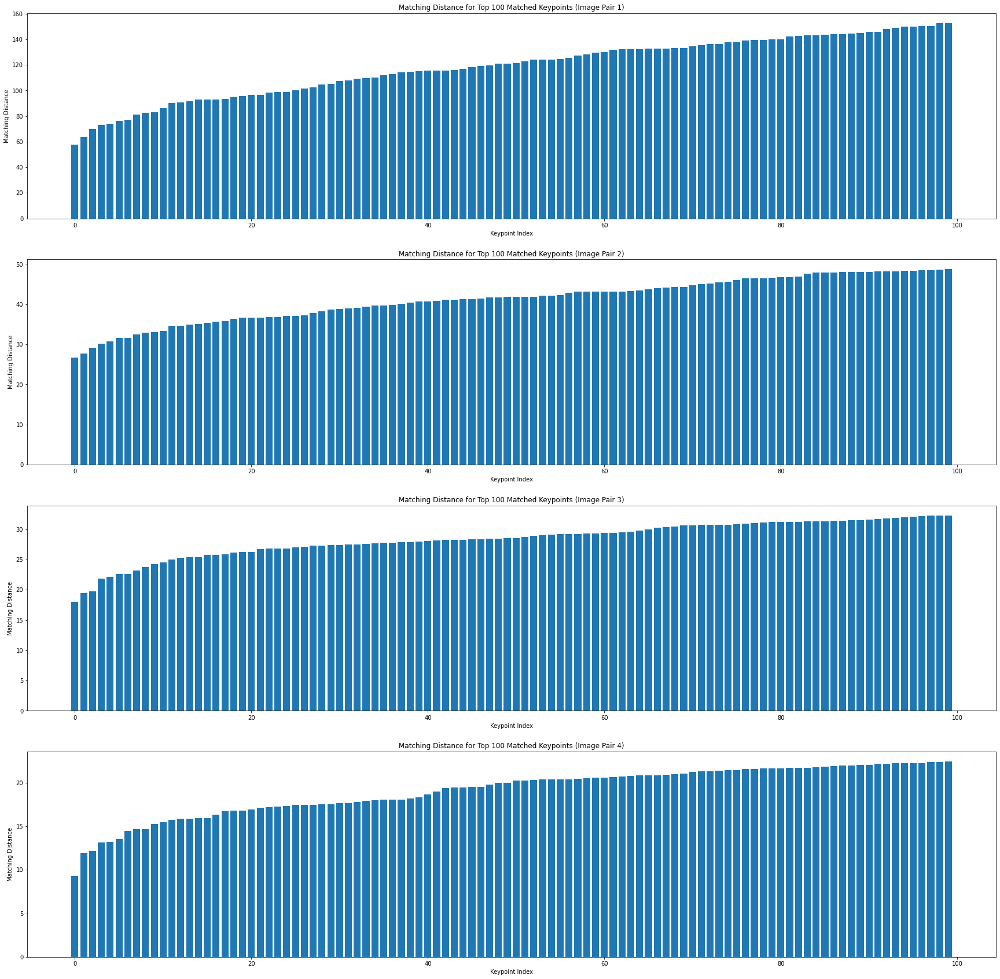

In [ ]:
# plot the maching distance for top 100 matched keypoints

# Get the matching distances for the top 100 matched keypoints
match_distances1 = [matches1[i].distance for i in range(100)]
match_distances2 = [matches2[i].distance for i in range(100)]
match_distances3 = [matches3[i].distance for i in range(100)]
match_distances4 = [matches4[i].distance for i in range(100)]

# Plot the bar graph
fig = plt.figure(figsize=(30,30))
fig.add_subplot(4,1,1)
plt.bar(range(100), match_distances1)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Image Pair 1)')

fig.add_subplot(4,1,2)
plt.bar(range(100), match_distances2)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Image Pair 2)')

fig.add_subplot(4,1,3)
plt.bar(range(100), match_distances3)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Image Pair 3)')

fig.add_subplot(4,1,4)
plt.bar(range(100), match_distances4)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Image Pair 4)')

# **8. Discuss the trend in the plotted results. What is the effect of increasing the scale on the matching distance? Explain.**

The trend in the plotted results is an increase in the matching distance with an increase in the scale. This can be seen on the bar graphs by noticing that the matching distance increases with the increasing image scale. This is because as the scale of the image increases, the SIFT descriptors for the keypoints are less and less accurate and as a result, the matching distance between the descriptors increases.

More specifically, SIFT uses Difference of Gaussians (DoG) filters to identify local extrema in the scale space and at higher scales, the images become more blurred and the local extrema are less distinct, making it harder to match keypoints.

**Sources:** course notes and reference textbook on the syllabus: Computer Vision: Algorithms and Applications, by Richard Szeliski, Springer 2010



# **4.3 Invariance Under Rotation**

(<matplotlib.image.AxesImage at 0x7f4719545520>,
 Text(0.5, 1.0, 'reference image rotated by 180 degrees'))

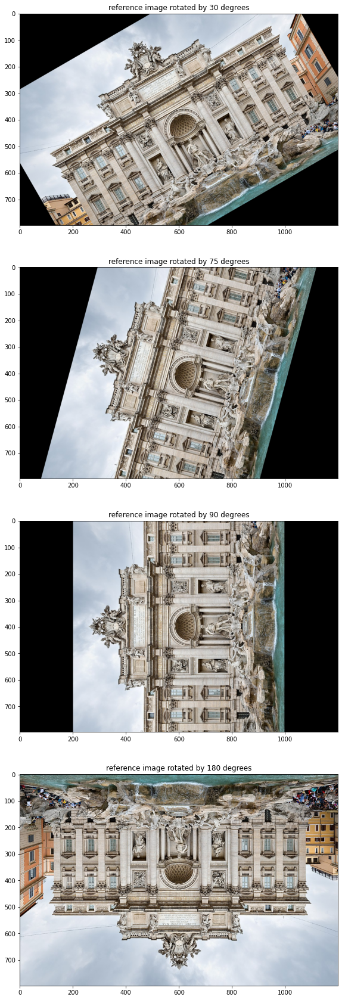

In [ ]:
# the idea to use cv2.getRotationMatrix2D and cv2.warpAffine functions
# was taken from tutorial 4. Further information was fetched on those websites:
# cv2.getRotationMatrix2D: https://www.geeksforgeeks.org/python-opencv-getrotationmatrix2d-function/
# cv2.warpAffine: https://docs.opencv.org/3.4/d4/d61/tutorial_warp_affine.html

H,W,D = img.shape

# Rotate the reference image at various angles
rot_matrix1 = cv2.getRotationMatrix2D(center=(W/2,H/2), angle=30, scale=1)
rot_matrix2 = cv2.getRotationMatrix2D(center=(W/2,H/2), angle=75, scale=1)
rot_matrix3 = cv2.getRotationMatrix2D(center=(W/2,H/2), angle=90, scale=1)
rot_matrix4 = cv2.getRotationMatrix2D(center=(W/2,H/2), angle=180, scale=1)

rotated_img1 = cv2.warpAffine(img, rot_matrix1, (W,H))
rotated_img2 = cv2.warpAffine(img, rot_matrix2, (W,H))
rotated_img3 = cv2.warpAffine(img, rot_matrix3, (W,H))
rotated_img4 = cv2.warpAffine(img, rot_matrix4, (W,H))

# display the rotated images
fig = plt.figure(figsize=(30,30))
fig.add_subplot(4,1,1)
plt.imshow(rotated_img1), plt.title("reference image rotated by 30 degrees")

fig.add_subplot(4,1,2)
plt.imshow(rotated_img2), plt.title("reference image rotated by 75 degrees")

fig.add_subplot(4,1,3)
plt.imshow(rotated_img3), plt.title("reference image rotated by 90 degrees")

fig.add_subplot(4,1,4)
plt.imshow(rotated_img4), plt.title("reference image rotated by 180 degrees")

(<matplotlib.image.AxesImage at 0x7f47191adfd0>,
 Text(0.5, 1.0, 'reference image matched with its rotation by 180 degrees'))

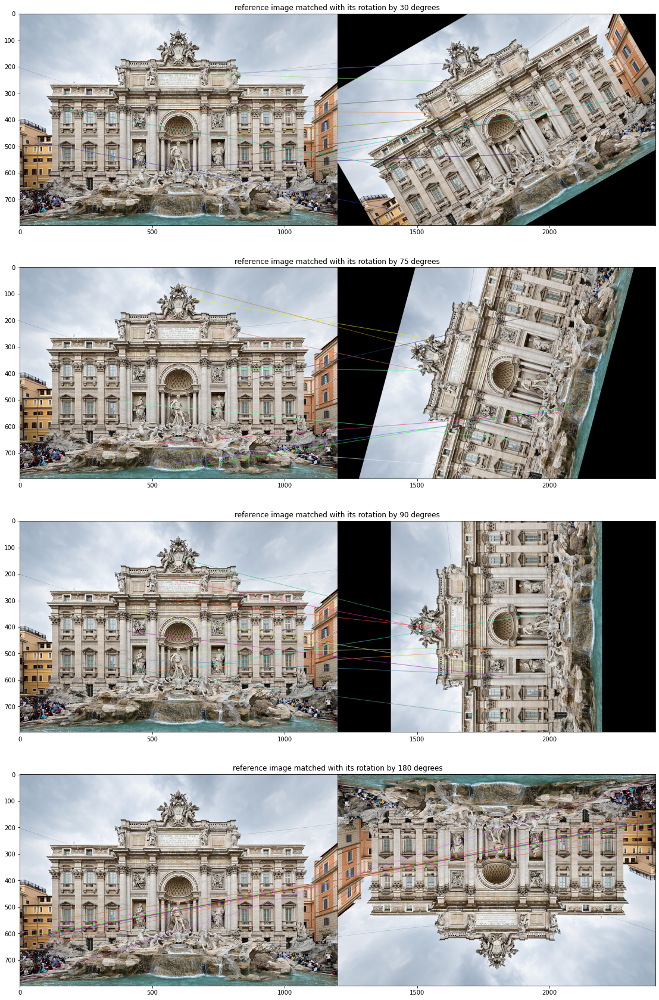

In [ ]:
# compute all sift keypoints
keypoints_r1, descriptors_r1 = sift_object.detectAndCompute(rotated_img1, None)
keypoints_r2, descriptors_r2 = sift_object.detectAndCompute(rotated_img2, None)
keypoints_r3, descriptors_r3 = sift_object.detectAndCompute(rotated_img3, None)
keypoints_r4, descriptors_r4 = sift_object.detectAndCompute(rotated_img4, None)

# get the matches with the original image
matches_r1 = list(bf_object.match(descriptors, descriptors_r1))
matches_r2 = list(bf_object.match(descriptors, descriptors_r2))
matches_r3 = list(bf_object.match(descriptors, descriptors_r3))
matches_r4 = list(bf_object.match(descriptors, descriptors_r4))

# sort the matches from 1 to 10
matches_r1.sort(key = distance)
matches_r2.sort(key = distance)
matches_r3.sort(key = distance)
matches_r4.sort(key = distance)

# plot the top ten matched keypoints for each image pair
# the setting flag=2, as used in the tutorial 4, allows to avoid having all the keypoints shown
match_r1_draw = cv2.drawMatches(img,keypoints, rotated_img1, keypoints_r1, matches_r1[:10], None, flags=2)
match_r2_draw = cv2.drawMatches(img,keypoints, rotated_img2, keypoints_r2, matches_r2[:10], None, flags=2)
match_r3_draw = cv2.drawMatches(img,keypoints, rotated_img3, keypoints_r3, matches_r3[:10], None, flags=2)
match_r4_draw = cv2.drawMatches(img,keypoints, rotated_img4, keypoints_r4, matches_r4[:10], None, flags=2)

# display the matched images
fig = plt.figure(figsize=(30,30))
fig.add_subplot(4,1,1)
plt.imshow(match_r1_draw), plt.title("reference image matched with its rotation by 30 degrees")

fig.add_subplot(4,1,2)
plt.imshow(match_r2_draw), plt.title("reference image matched with its rotation by 75 degrees")

fig.add_subplot(4,1,3)
plt.imshow(match_r3_draw), plt.title("reference image matched with its rotation by 90 degrees")

fig.add_subplot(4,1,4)
plt.imshow(match_r4_draw), plt.title("reference image matched with its rotation by 180 degrees")

Text(0.5, 1.0, 'Matching Distance for Top 100 Matched Keypoints (Rotation of 180 degrees)')

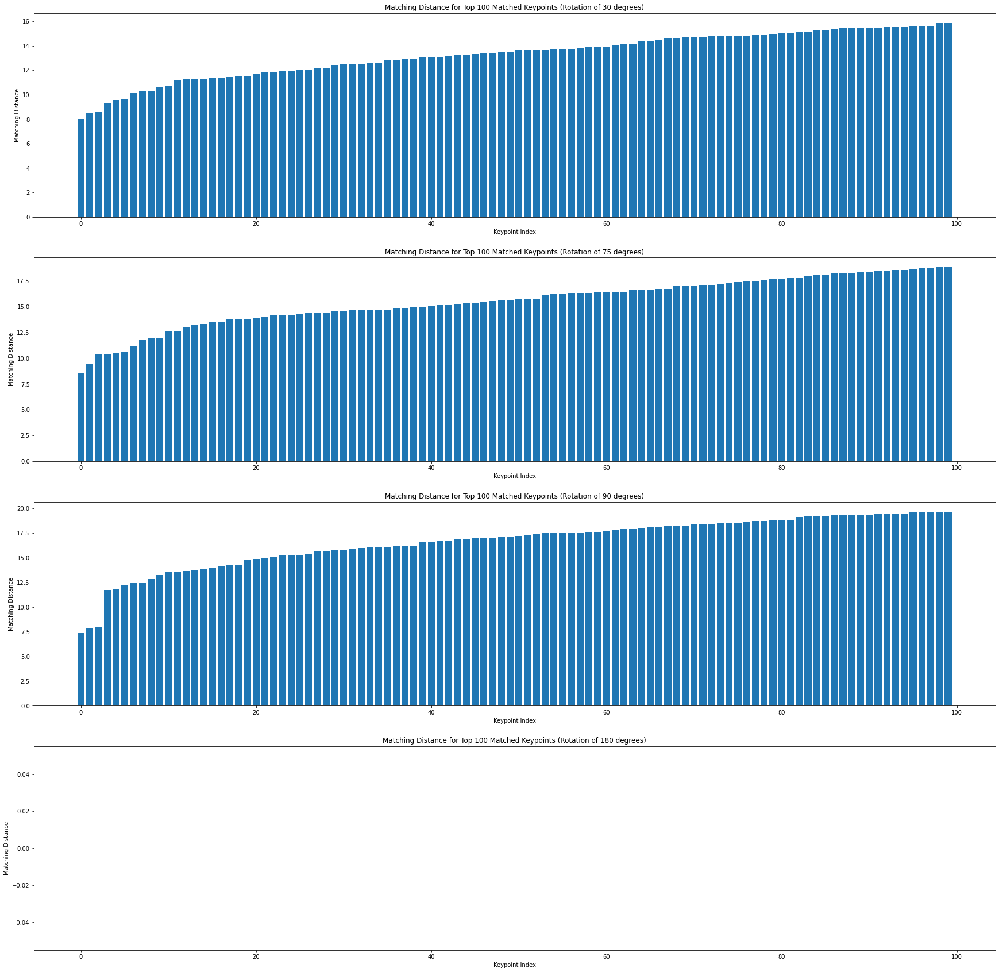

In [ ]:
# plot the maching distance for top 100 matched keypoints

# Get the matching distances for the top 100 matched keypoints
match_distances_r1 = [matches_r1[i].distance for i in range(100)]
match_distances_r2 = [matches_r2[i].distance for i in range(100)]
match_distances_r3 = [matches_r3[i].distance for i in range(100)]
match_distances_r4 = [matches_r4[i].distance for i in range(100)]

# Plot the bar graph
fig = plt.figure(figsize=(30,30))
fig.add_subplot(4,1,1)
plt.bar(range(100), match_distances_r1)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Rotation of 30 degrees)')

fig.add_subplot(4,1,2)
plt.bar(range(100), match_distances_r2)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Rotation of 75 degrees)')

fig.add_subplot(4,1,3)
plt.bar(range(100), match_distances_r3)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Rotation of 90 degrees)')

fig.add_subplot(4,1,4)
plt.bar(range(100), match_distances_r4)
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Matched Keypoints (Rotation of 180 degrees)')

# **4.3.7. Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Explain.**

From the graphs above, it can be seen that as the angle of rotation increases, the matching distance also increases. This is true until 90 degrees, where the matching distance between the SIFT keypoints is the highest. This happens because SIFT is robust to changes in rotation (rotation-invariant) and as the angle of rotation becomes bigger, the keypoints still match but they are separated by an increasing distance.

The matching distance starts to decrease for angles greater than 90 degrees and at 180 degrees, the image is perfectly flipped upside down. Since the x and y distances in matching SIFT keypoints are calculated from the middle of the image, at 180 degrees, they are are the exact opposite. This means that when they are added up, they simply cancell out, giving a matching distance of 0. This is consistent with the graph showing the 180 degrees rotation, where all the matching distances are 0.

**Sources:** lecture notes, tutorial 4 and suggested book reading on the syllabus:
Computer Vision: Algorithms and Applications, by Richard Szeliski, Springer 2010

